In [638]:
#if running on google colab or never installed dependencies before
!pip install scikit-learn
!pip install --no-deps ipfx
!pip install pandas
!pip install pyabf
!pip install seaborn
!pip install matplotlib

In [ ]:

##NEWEST VERSION
!pip install sklearn
from ipfx.feature_extractor import (SpikeFeatureExtractor, SpikeTrainFeatureExtractor)


import pyabf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from itertools import compress
from scipy.signal import find_peaks
from scipy.signal import peak_widths
from scipy.signal import peak_prominences
from scipy.optimize import curve_fit
from scipy.stats import linregress
import scipy.stats
import pandas as pd
import seaborn as sns
sns.set()
plt.style.use('dark_background')
sns.set_theme(style="dark")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
# Function to calculate dv/dt
def dv_dt (abf, sweep, sampling_rate, half_window_ms):
    # Select the trace in your recording
    sweep = abf.setSweep(sweepNumber=sweep, channel=0)
    # Identify the action potential with highest dV
    dv = np.diff(abf.sweepY)
    dv_max = np.argmax(dv)
    # Set the time window for the selected action potential
    sampling_rate = sampling_rate
    half_window_ms = half_window_ms
    half_window = (half_window_ms * sampling_rate)//1000
    global t_window
    t_window = abf.sweepX[dv_max-half_window:dv_max+half_window]
    v_window = abf.sweepY[dv_max-half_window:dv_max+half_window]
    # Calculate dv_dt for the selected action potential
    dv_ap = np.diff(v_window)
    dt_ap = np.diff(t_window*1000)
    dv_dt = (dv_ap)/(dt_ap)
    dv_dt_max = np.amax(dv_dt)
    # Remove the first v value to match the dv/dt array which is n-1
    v_ap_array = np.delete(v_window, 1)
    # Return the selected outputs from the function
    return {'voltage': v_window, 'dv_dt': dv_dt, 
            'dv_dt_max': dv_dt_max, 'time': t_window,
            'voltage_array': v_ap_array}

# Define the logarithmic function
def logarithmic_function(x, a, b):
    return a * np.log(x) + b


def spike_analysis(abf_file):
    fig = plt.figure()
    name = str(abf_file)
    folder_path = abf_file.split('/')
    file_name = folder_path[-1]
    file_name = file_name[:-4]
    print(file_name)
    parts = file_name.split('_')
    date = parts[0] + parts[1] + parts[2]
    protocol_num = parts[3]
    slice_num = parts[4]
    cell_num = parts[5]
    region = parts[6]
    layer = parts[7]
    treatment = parts[8]
    cell_type = parts[9]
    genotype = parts[10]
    rheobase = None
    abf = pyabf.ABF(abf_file)
    # Set the table from the dataframe below
    dataframe = [] 
    abf.setSweep(0)
    time = abf.sweepX
    voltage = abf.sweepY
    current = abf.sweepC
    start = None
    for t in time:
        if t > 0.18:
            start = t
            break
    end = None
    for t in time: 
        if t > 1.18:
            end = t
            break
    # Loop function to analyze each voltage trace of the file
    for sweepNumber in abf.sweepList:
        if rheobase == None:
            pass
        else:
            if sweepNumber > rheobase + 10:
                break
        abf.setSweep(sweepNumber)
        time = abf.sweepX
        voltage = abf.sweepY
        current = abf.sweepC
        # Parameters for analysis: 
        sfx = SpikeFeatureExtractor (start, end, 
                                     filter=None, # cutoff frequency for 4-pole low-pass Bessel filter in kHz 
                                     dv_cutoff=25.0,  # minimum dV/dt to qualify as a spike in V/s 
                                     thresh_frac=0.05,  # fraction of average upstroke for threshold calculation
                                     min_peak=0, max_interval=0.05)  
        sfx_results = sfx.process(time, voltage, current)
        if not sfx_results.empty:
            if rheobase == None:
                rheobase = sweepNumber
            else:
                pass
            #x_vals = time[start_index:sfx_results['threshold_index'][0]]
            #y_vals = voltage[start_index:sfx_results['threshold_index'][0]]
            #params, _ = curve_fit(logarithmic_function, x_vals, y_vals)
            # Generate line of best fit
            #x_fit = np.linspace(min(x_vals), max(x_vals), len(x_vals))
            #y_fit = logarithmic_function(x_fit, *params)
            # Calculate R-squared value
            #y_predicted = logarithmic_function(x_vals, *params)
            #slope, intercept, r_value, p_value, std_err = linregress(y_vals, y_predicted)
            #r_squared = r_value ** 2
            #if r_squared > 0.75:
            num_rows = sfx_results.shape[0]
            current = {'date': date, 'protocol_num': protocol_num, 'slice': slice_num, 'cell': cell_num, 'region': region, 'layer': layer, 'treatment': treatment, 'cell_type': cell_type, 'animal_genotype': genotype}
            current = pd.DataFrame([current])
            current = pd.concat([current] * num_rows, ignore_index=True)
            my_list = [sweepNumber] * num_rows
            #r_squared_rise = [r_squared] * num_rows
            file_list = [file_name] * num_rows
            #end_column = pd.Series(r_squared_rise, name='r_squared_rise')
            new_column = pd.Series(my_list, name='sweep')
            file_column = pd.Series(file_list, name = 'file_name')
            rise_time = pd.Series(sfx_results['peak_t']-sfx_results['threshold_t'], name = 'rise_time')
            fall_time = pd.Series(sfx_results['trough_t']-sfx_results['peak_t'], name = 'fall_time')
            amplitude = pd.Series(sfx_results['peak_v']-sfx_results['trough_v'], name = 'amplitude')
            new_frame = pd.concat([current, file_column, new_column, sfx_results, rise_time, fall_time, amplitude], axis = 1)
            dataframe.append(new_frame)  # To get the mean: df.append(sfx_results.mean())
            plt.plot(abf.sweepX, abf.sweepY, alpha=.6, label="sweep %d" % (sweepNumber))
            
            #plt.scatter(sfx_results['threshold_t'], sfx_results['threshold_v'])
            plt.scatter(sfx_results['peak_t'], sfx_results['peak_v'])
    plt.xlim(0.185, 1.2)
    plt.show()
    indiv_table = pd.concat(dataframe)
    return indiv_table
    
def input_output(abf_file):
    folder_path = abf_file.split('/')
    file_name = folder_path[-1]
    file_name = file_name[:-4]
    parts = file_name.split('_')
    date = parts[0] + parts[1] + parts[2]
    protocol_num = parts[3]
    slice_num = parts[4]
    cell_num = parts[5]
    region = parts[6]
    layer = parts[7]
    treatment = parts[8]
    cell_type = parts[9]
    genotype = parts[10]
    abf = pyabf.ABF(abf_file)
    # Set the dataframe for the table
    table = pd.DataFrame()
    currents = [] # Current value between t1 and t2 (ms) for each step
    rheobase = None
    # Loop function to analyze each voltage and current trace of the file
    for sweep in abf.sweepList:
        if rheobase == None:
            pass
        else:
            if sweep > rheobase + 10:
                break  
        abf.setSweep(sweep)
        time = abf.sweepX
        voltage = abf.sweepY
        current = abf.sweepC
        
        current_mean = np.average(abf.sweepC[t1:t2])
        currents.append(np.average(abf.sweepC[t1:t2]))
        start = None
        for t in time:
            if t > 0.18:
                start = t
                break
        end = None
        for t in time: 
            if t > 1.18:
                end = t
                break
        sfx = SpikeFeatureExtractor (start, end, 
                                 filter=None, # cutoff frequency for 4-pole low-pass Bessel filter in kHz 
                                 dv_cutoff=25.0,  # minimum dV/dt to qualify as a spike in V/s 
                                 thresh_frac=0.05,  # fraction of average upstroke for threshold calculation
                                 min_peak=0, max_interval=0.05) 
        sfx_results = sfx.process(time, voltage, current)
        if not sfx_results.empty:
            if rheobase == None:
                rheobase = sweep
            else:
                pass
        stfx = SpikeTrainFeatureExtractor (start=start, end=end)
        stfx_results = stfx.process(time, voltage, current, sfx_results)

        # Create a table with the stfx results
        length = len(table)
        table.loc[length, 'current_step'] = current_mean
        table.loc[length, 'avg_rate'] = stfx_results["avg_rate"]
        current = {'date': date, 'protocol_num': protocol_num, 'slice': slice_num, 'cell': cell_num, 'region': region, 'layer': layer, 'treatment': treatment, 'cell_type': cell_type, 'animal_genotype': genotype}
        current = pd.DataFrame([current])
        for col in current.columns:
            table.loc[length, col] = current[col].values[0]
        if stfx_results ['avg_rate'] > 0:
            table.loc[length, 'adaptation'] = stfx_results ["adapt"]
            table.loc[length, 'Latency_s'] = stfx_results ["latency"]
            table.loc[length, 'ISI_CV'] = stfx_results ["isi_cv"]
            table.loc[length, 'ISI_mean_ms'] = stfx_results ["mean_isi"]*1000
            table.loc[length, 'ISI_first_ms'] = stfx_results ["first_isi"]*1000
            
    # Optional Plotting: example with three subplots
    fig = plt.figure(figsize=(15, 5))
    # Input-output curve
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.scatter(currents, table.loc[:,'avg_rate'])
    ax1.set_xlabel('Current step (pA)')
    ax1.set_ylabel('Action potentials')
    # All traces
    ax2 = fig.add_subplot(2, 2, 2)
    for sweep in abf.sweepList:
        abf.setSweep(sweep)
        ax2.plot(abf.sweepX, abf.sweepY, alpha=.6, label="Sweep %d" % (sweep))
    ax2.set_ylabel('Membrane voltage (mV)')
    # ax2.legend() # Optional
    # To highllight one trace
    abf.setSweep(rheobase) 
    ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='black')
    ax2.axes.set_xlim(0, 1.2) # Range of the x-axis (seconds)

    # All current steps
    ax3 = fig.add_subplot(2, 2, 4, sharex=ax2) 
    for sweep in abf.sweepList:
        abf.setSweep(sweep)
        current = abf.sweepC
        ax3.plot(abf.sweepX, current)
    ax3.set_ylabel("Current (pA)")
    ax3.set_xlabel("Time (s)")
    # To highllight one current trace
    abf.setSweep(rheobase) 
    ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='black')
    fig.tight_layout()
    # Show the graph and the table results 
    plt.show()
    return table, rheobase

def phase_plots(abf_file, rheobase):
    abf = pyabf.ABF(abf_file)
    # Inputs (the abf file, sweep number, sampling rate, half-window in ms)
    dv_dt80 = dv_dt(abf, rheobase, 20000, 12)
    # Table with the voltage and dV/dt values
    table80 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
    table80['voltage'] = pd.Series(dv_dt80['voltage'])
    table80['dv_dt'] = pd.Series(dv_dt80['dv_dt'])
    # Graphs
    fig = plt.figure(figsize=(6, 3))
    # Action potential
    ax1 = fig.add_subplot(121)
    ax1.set_title('Action potential Rheobase + 80pA')
    ax1.plot(dv_dt80['time'], dv_dt80['voltage'])
    ax1.set_ylabel("V (mV)") 
    ax1.set_xlabel("t (s)")
    # Phase plot
    ax2 =fig.add_subplot(122)
    ax2.set_title('Phase-plane plot Rheobase + 80pA')
    ax2.plot(dv_dt80['voltage_array'], dv_dt80['dv_dt'])
    ax2.set_ylabel("dV/dt (mV/ms)") 
    ax2.set_xlabel("V (mV)") 


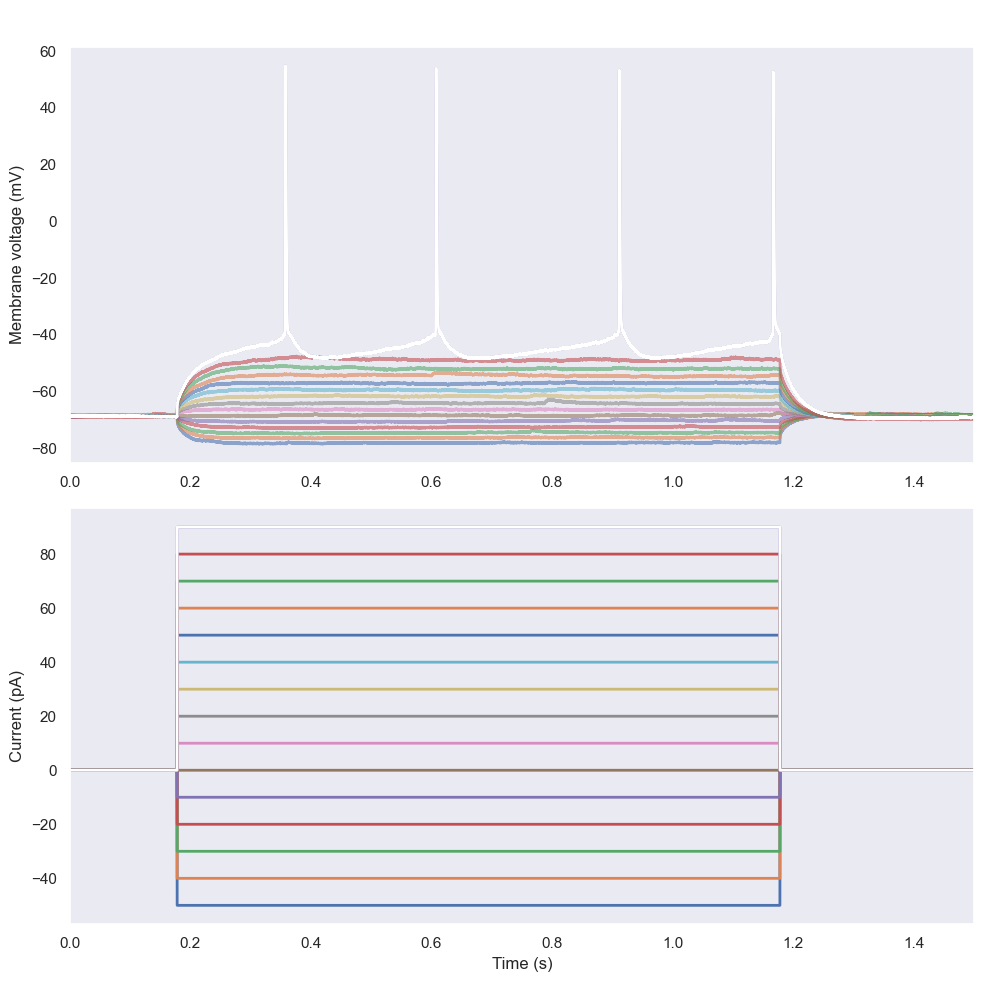

In [615]:

rheobase = None
abf = pyabf.ABF('/Users/alicelin/Desktop/abf_files/2023_09_20_0018_slice1_cell1_cortex_layer2_no-treatment_PN_WT.abf')
# Set the table from the dataframe below
# Optional Plotting: example with three subplots
fig = plt.figure(figsize=(10, 10))
# All traces
ax2 = fig.add_subplot(2, 1, 1)
for sweep in abf.sweepList:
    if sweep > 14:
        break
    abf.setSweep(sweep)
    ax2.plot(abf.sweepX, abf.sweepY, alpha=.6, linewidth=2, label="Sweep %d" % (sweep))
ax2.set_ylabel('Membrane voltage (mV)')
# ax2.legend() # Optional
# To highllight one trace
abf.setSweep(14) 
ax2.plot(abf.sweepX, abf.sweepY, linewidth=2, color='white')
ax2.axes.set_xlim(0, 1.5) # Range of the x-axis (seconds)

# All current steps
ax3 = fig.add_subplot(2, 1, 2, sharex=ax2) 
for sweep in abf.sweepList:
    if sweep > 14:
        break
    abf.setSweep(sweep)
    current = abf.sweepC
    ax3.plot(abf.sweepX, current, linewidth=2)
ax3.set_ylabel("Current (pA)")
ax3.set_xlabel("Time (s)")
# To highllight one current trace
abf.setSweep(14) 
ax3.plot(abf.sweepX, abf.sweepC, linewidth=2, color='white')
fig.suptitle('Action Potentials Elicited from Current Injection', color='white')
fig.tight_layout()
# Show the graph and the table results 

                # Save the figure
# Set the background color to black
plt.rcParams['axes.facecolor'] = 'black'
plt.rcParams['figure.facecolor'] = 'black'

# Set the text color to white
plt.rcParams['text.color'] = 'white'
plt.rcParams['axes.labelcolor'] = 'white'
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
plt.rcParams['legend.facecolor'] = 'black'
plt.rcParams['legend.edgecolor'] = 'white'
fig.savefig("/Users/alicelin/Desktop/abf_files/PLOT.svg", dpi=300)
plt.show()


2023_09_27_0065_slice5_cell1_cortex_layer2_100um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


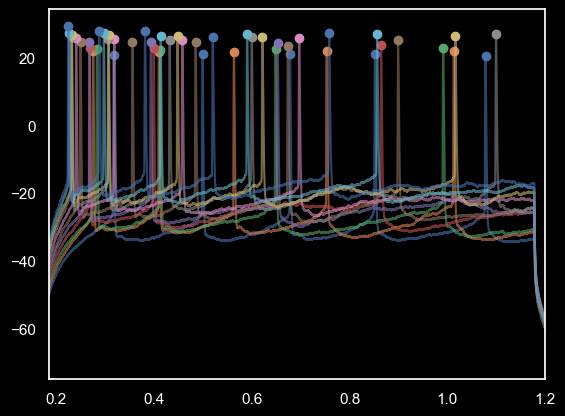

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

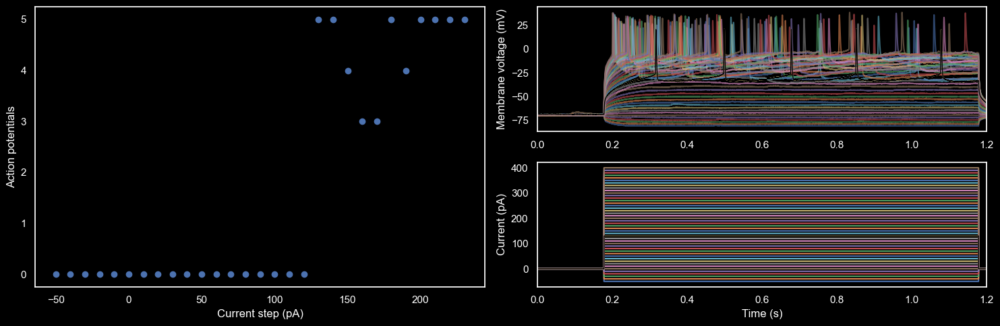

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_09_27_0019_slice2_cell1_cortex_layer2_100um-citrate_PN_WT


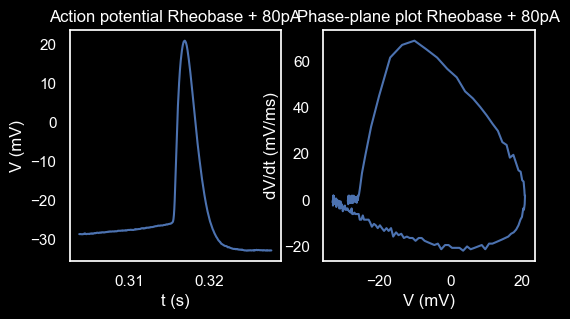

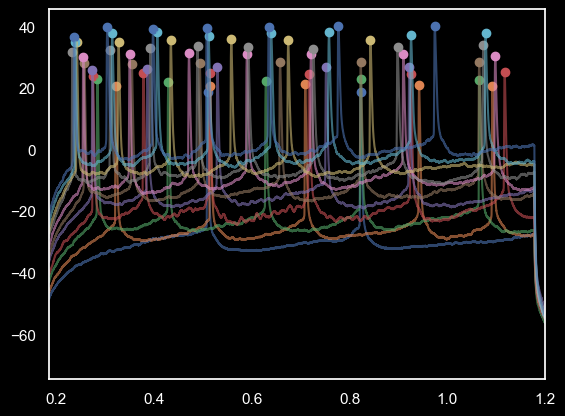

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

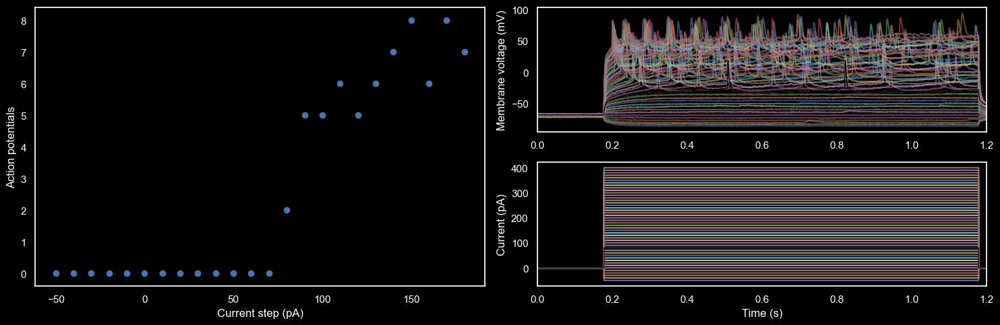

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0036_slice1_cell1_cortex_layer2_washout_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


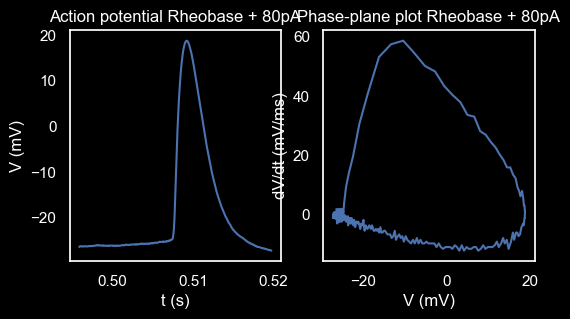

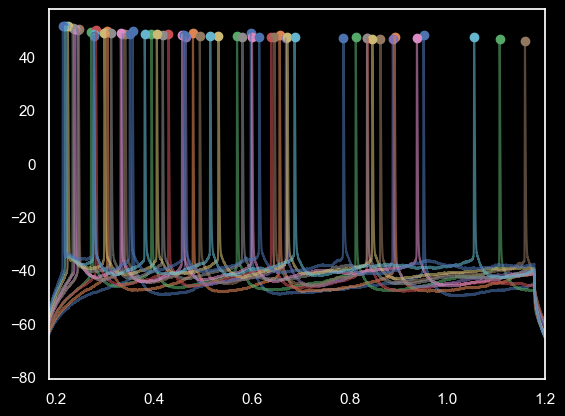

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


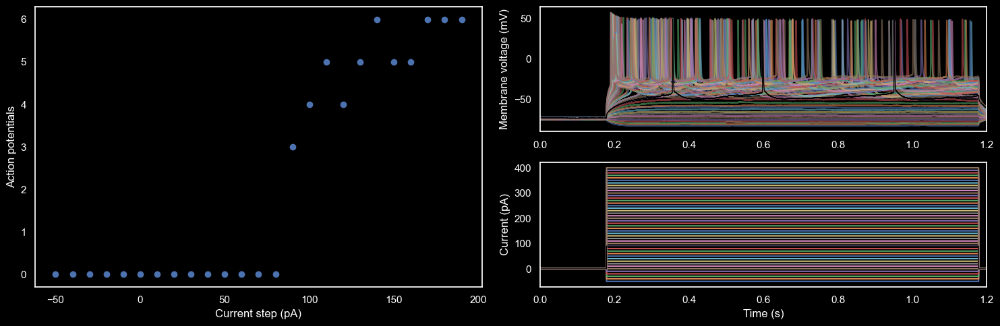

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0059_slice5_cell1_cortex_layer2_25um-citrate_PN_WT


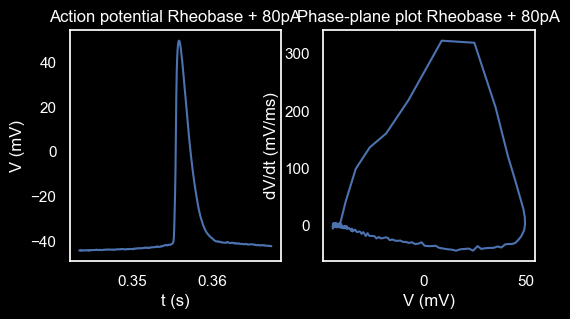

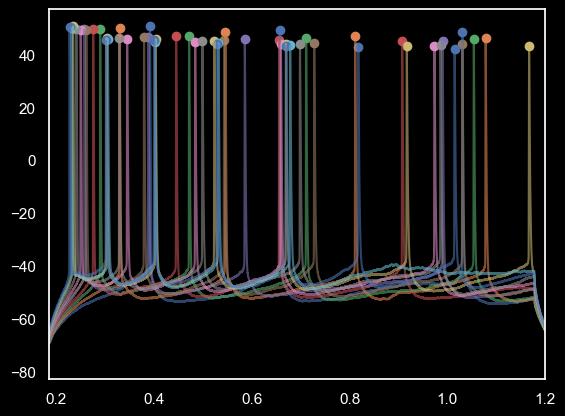

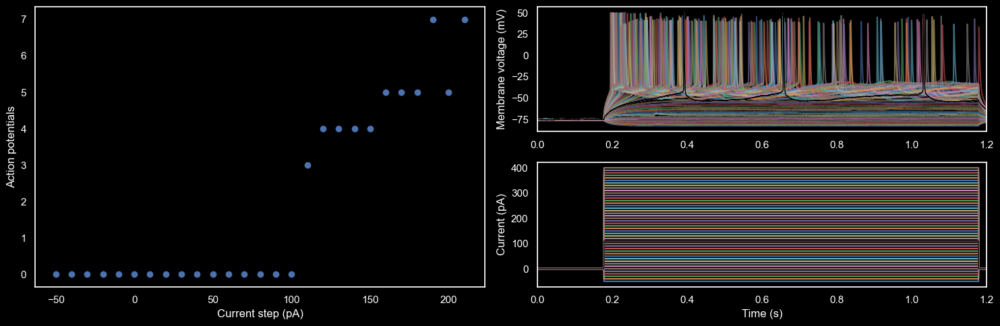

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_09_27_0045_slice4_cell1_cortex_layer2_50um-citrate_PN_WT


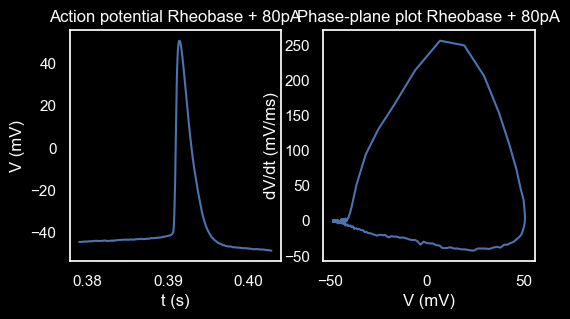

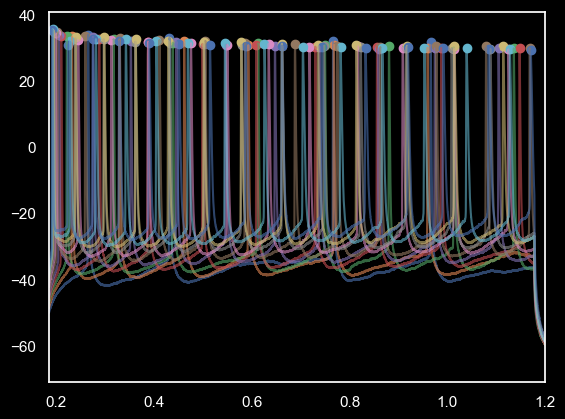

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

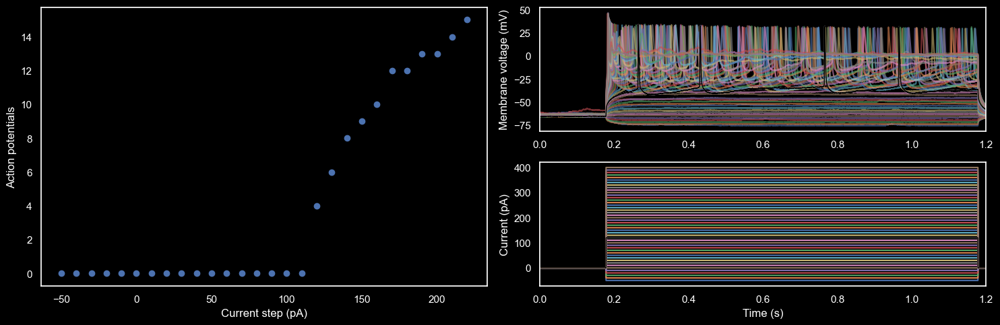

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0024_slice1_cell1_cortex_layer2_50um-citrate_PN_WT


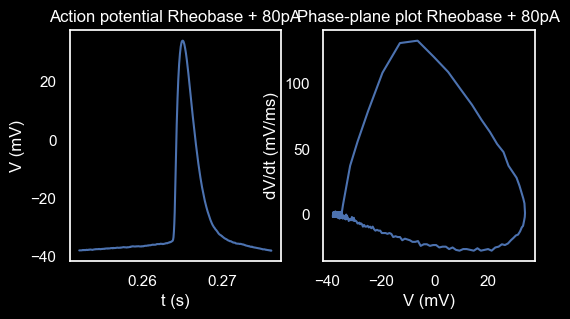

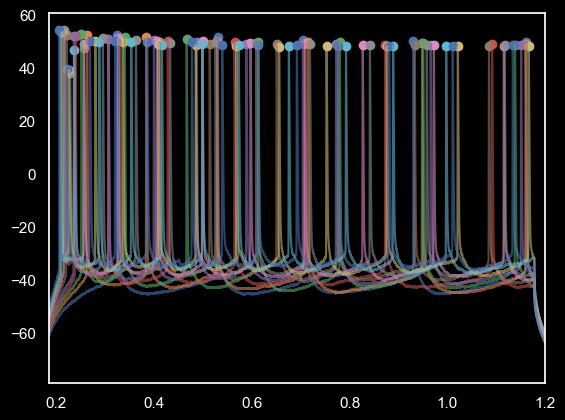

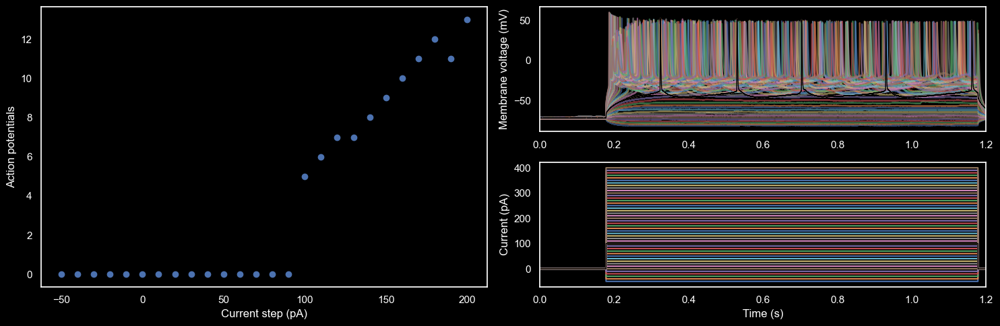

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_09_20_0052_slice3_cell2_cortex_layer2_100um-citrate_PN_WT


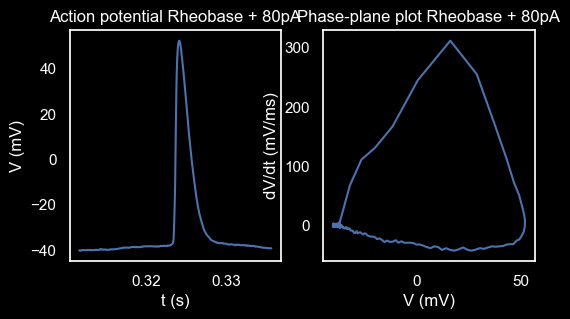

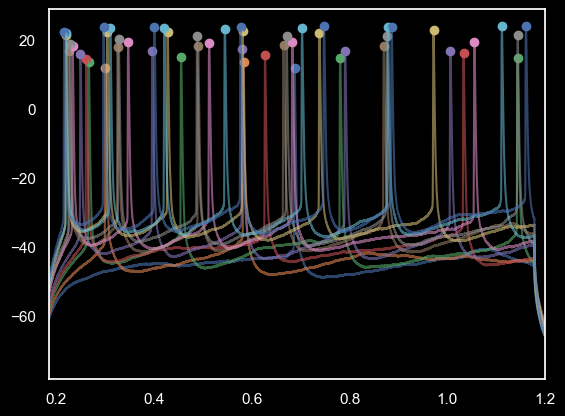

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

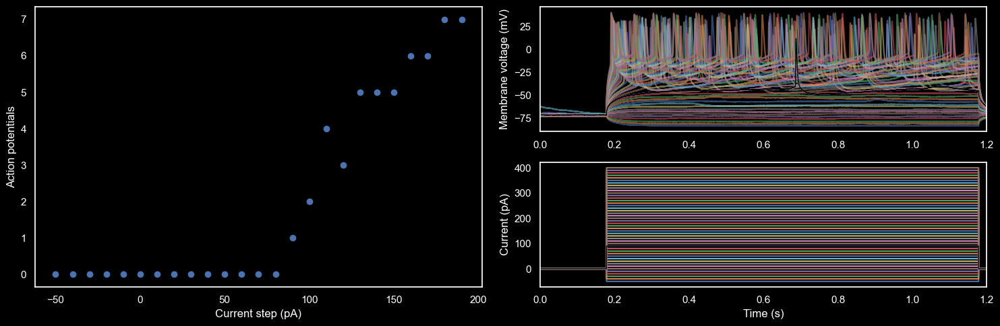

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0016_slice2_cell1_cortex_layer2_50um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


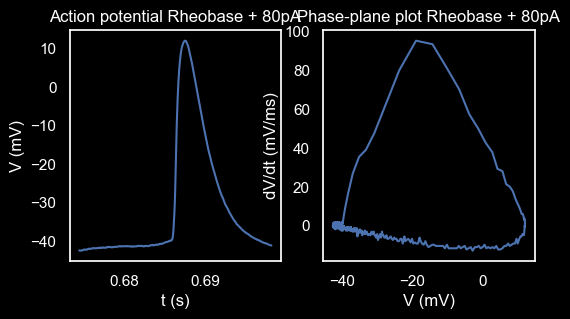

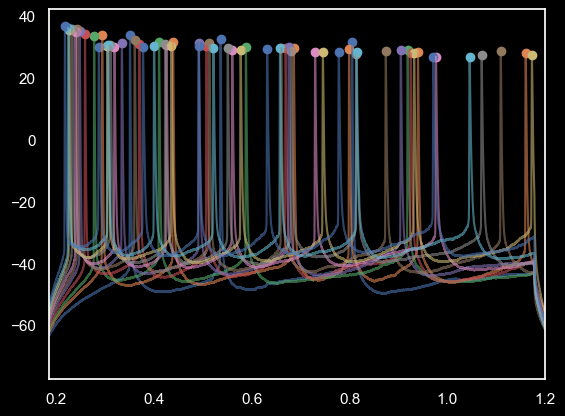

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

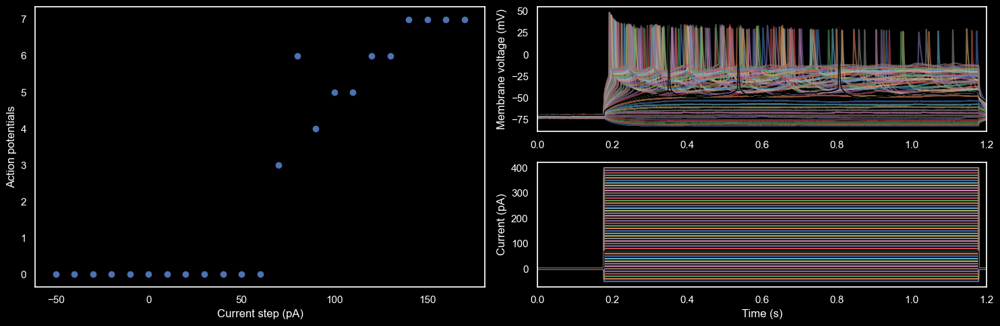

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0039_slice4_cell1_cortex_layer2_no-treatment_PN_WT


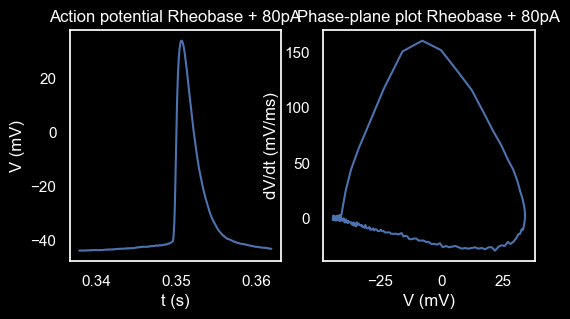

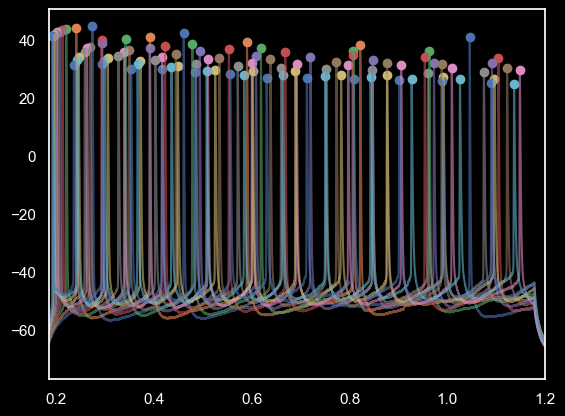

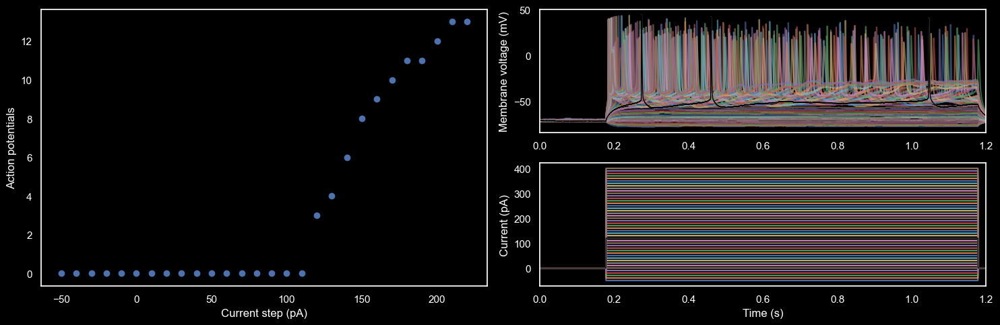

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0062_slice5_cell1_cortex_layer2_50um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


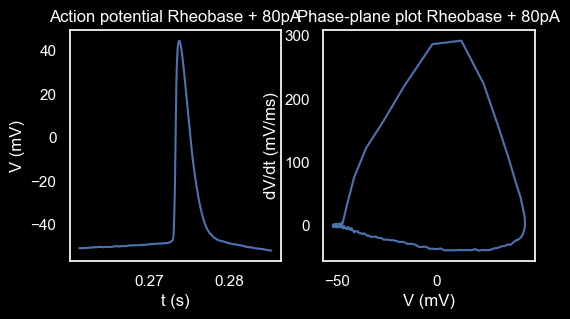

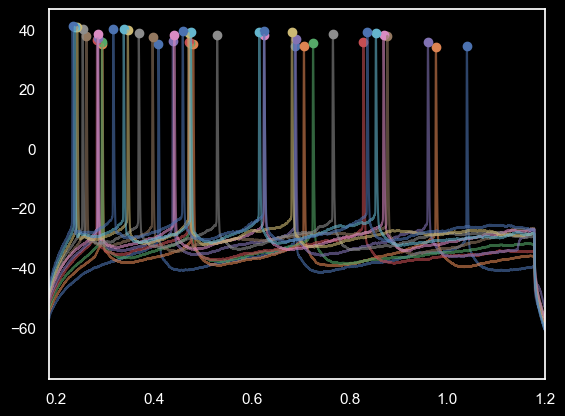

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

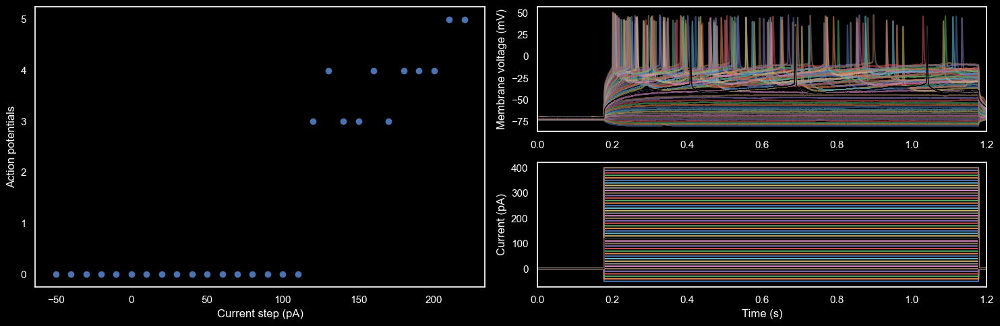

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_21_0000_slice3_cell2_cortex_layer2_400um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


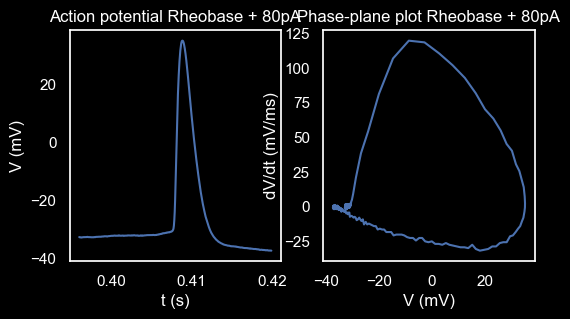

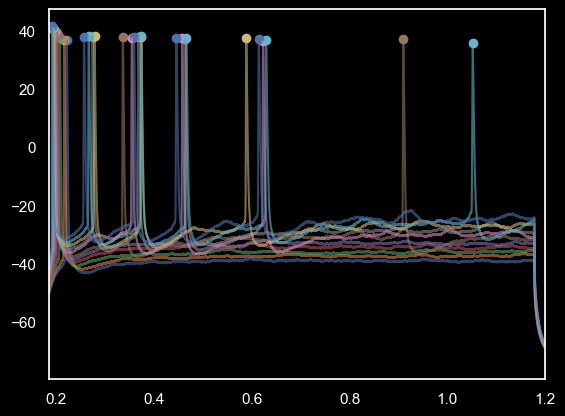

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

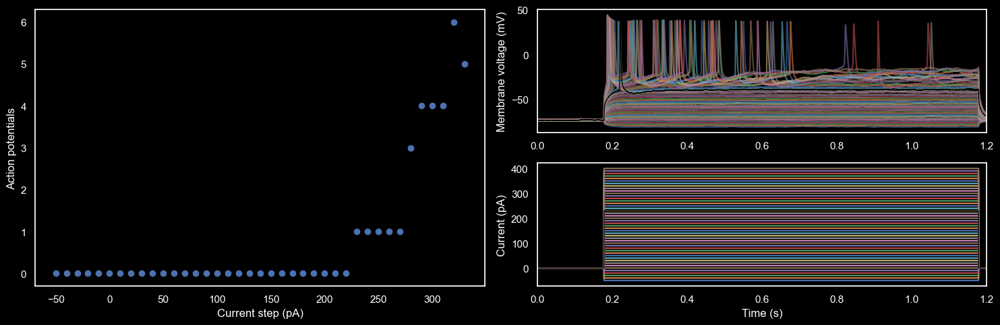

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0049_slice3_cell2_cortex_layer2_50um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


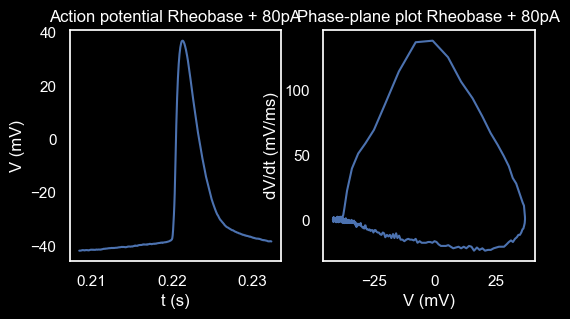

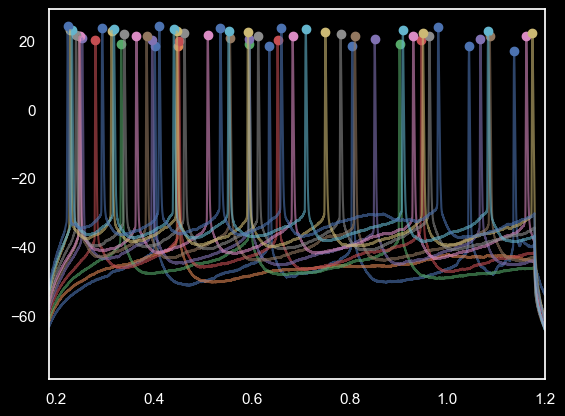

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


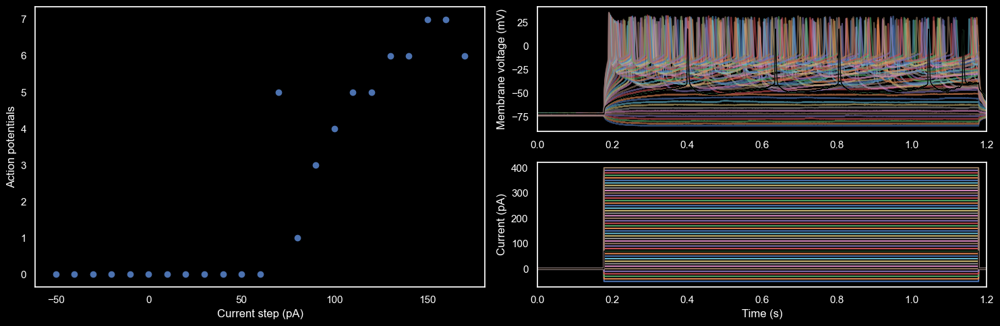

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_10_01_0036_slice2_cell1_cortex_layer2_200um-citrate_PN_KO


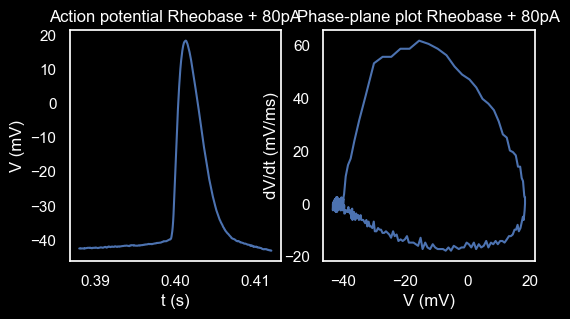

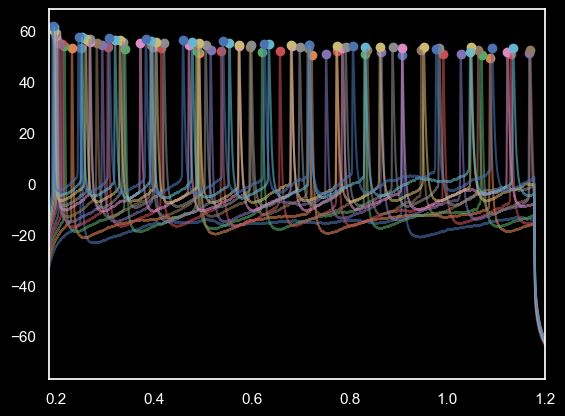

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

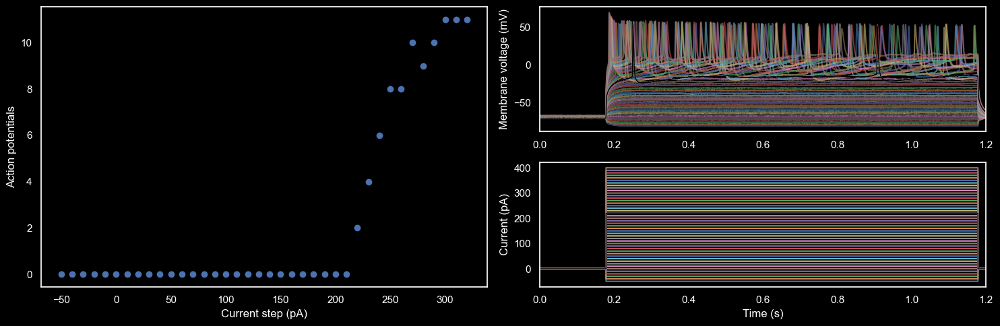

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0042_slice4_cell1_cortex_layer2_25um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


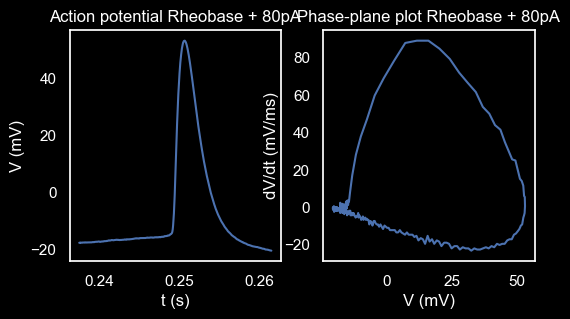

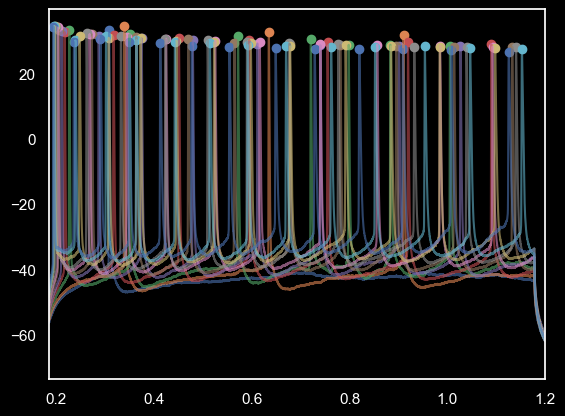

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

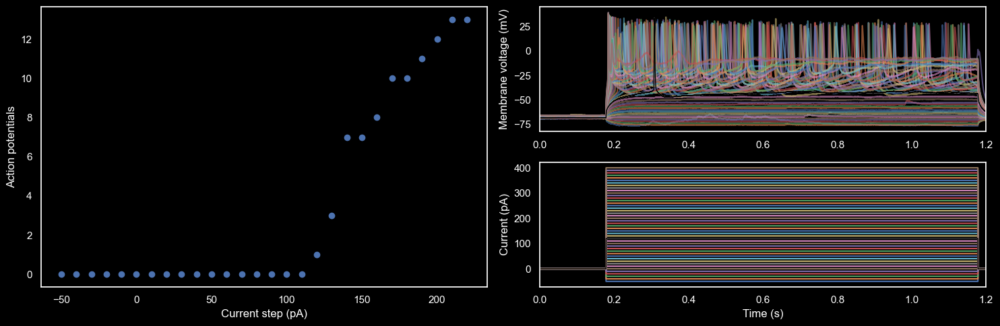

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0018_slice1_cell1_cortex_layer2_no-treatment_PN_WT


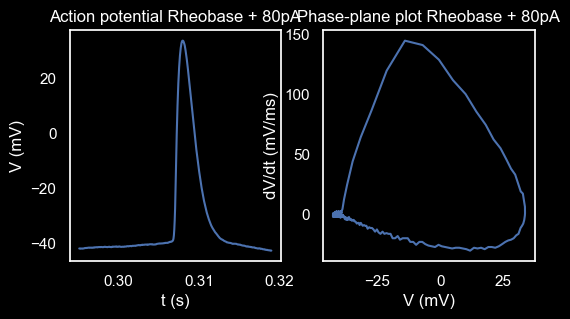

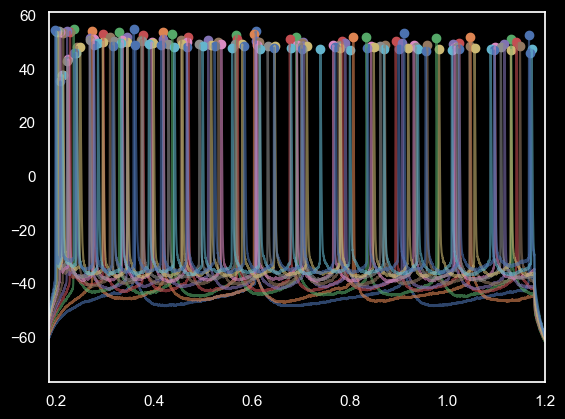

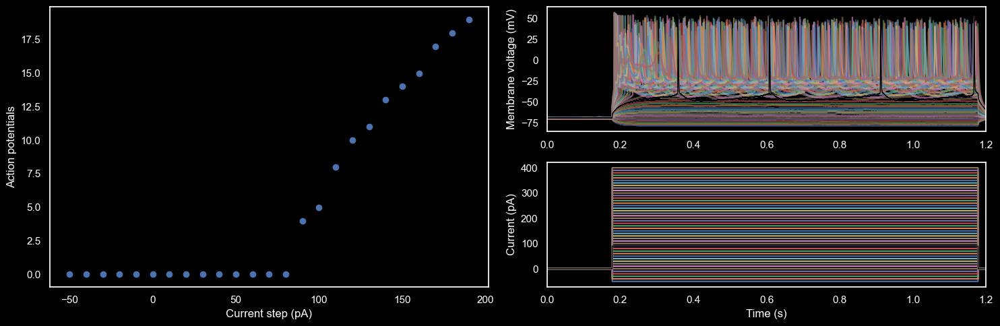

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_10_01_0031_slice2_cell1_cortex_layer2_25um-citrate_PN_KO


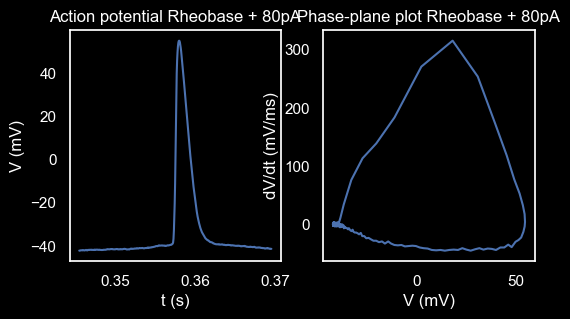

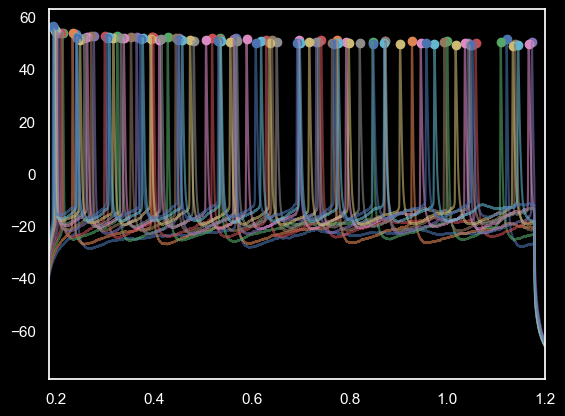

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

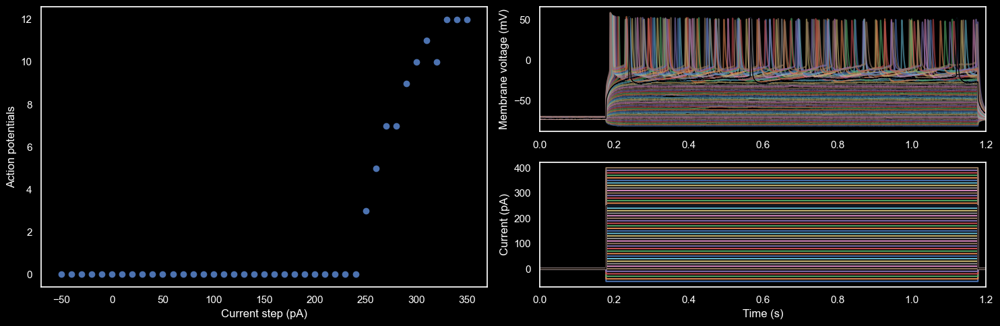

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0021_slice1_cell1_cortex_layer2_25um-citrate_PN_WT


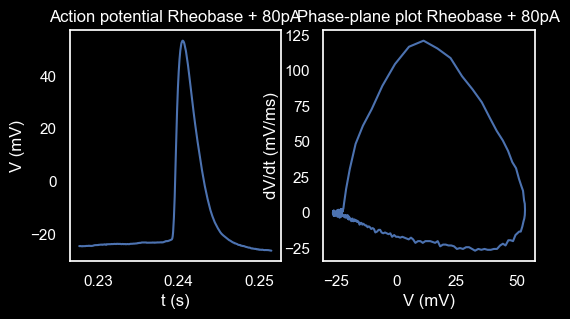

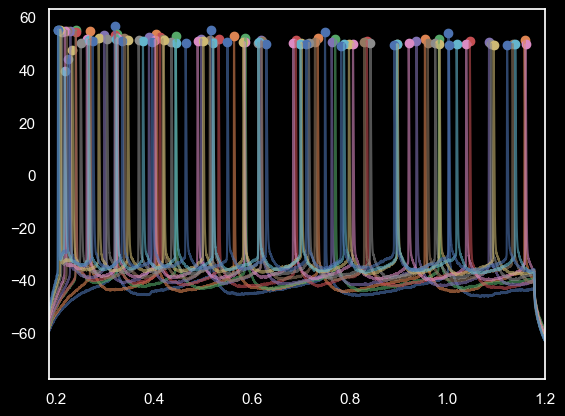

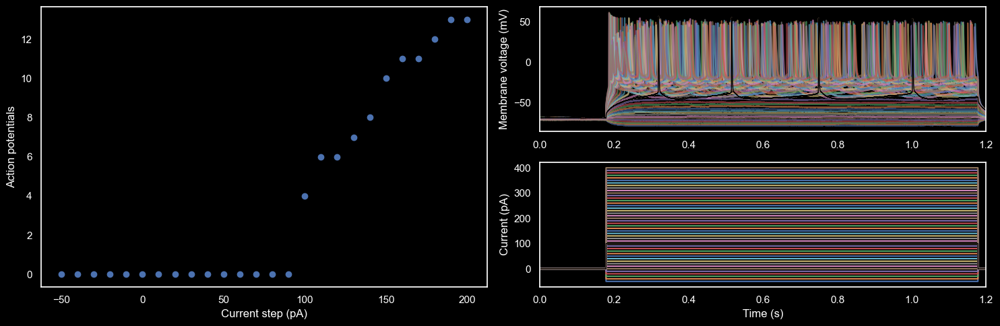

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0031_slice1_cell1_cortex_layer2_200um-citrate_PN_WT


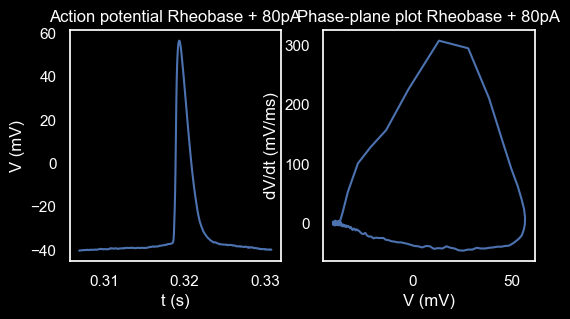

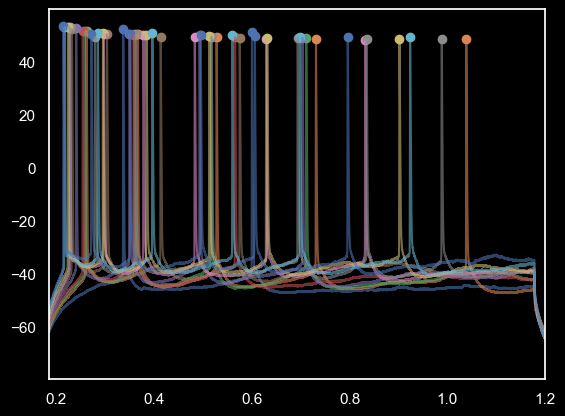

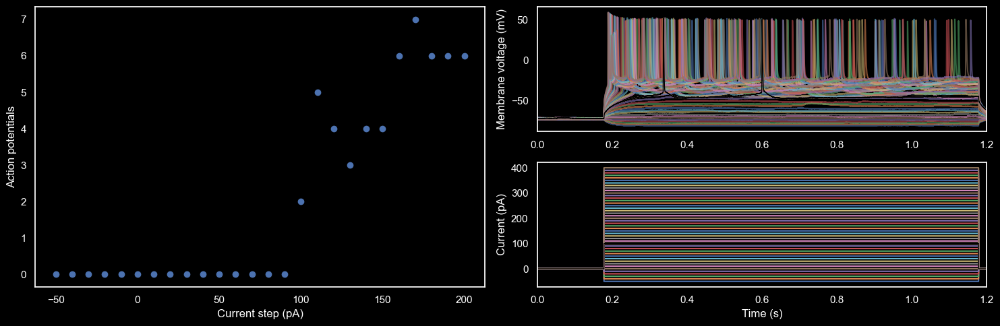

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0013_slice2_cell1_cortex_layer2_25um-citrate_PN_WT


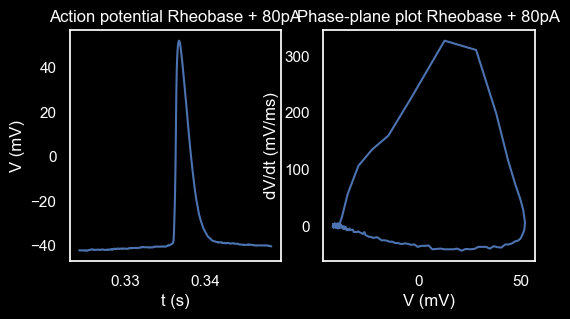

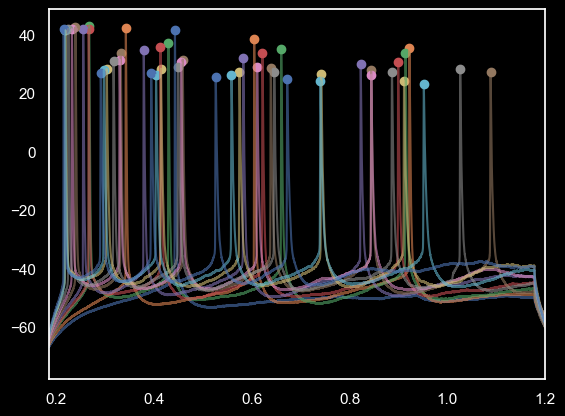

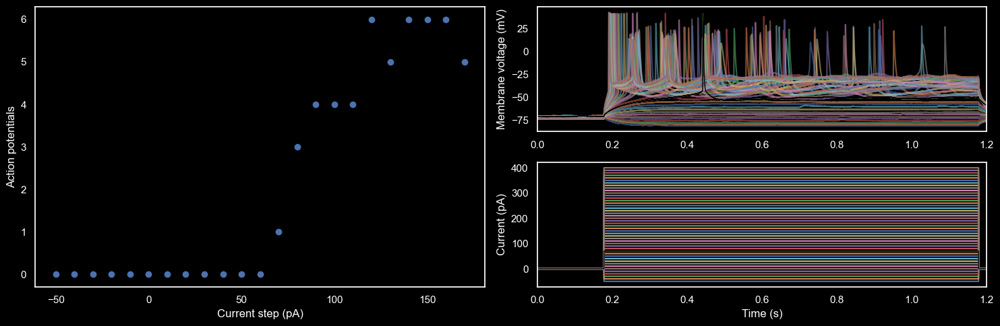

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_09_27_0054_slice4_cell1_cortex_layer2_400um-citrate_PN_WT


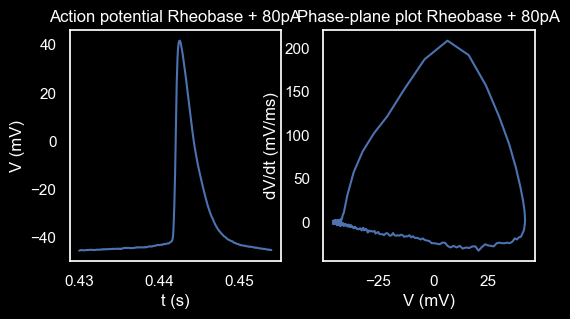

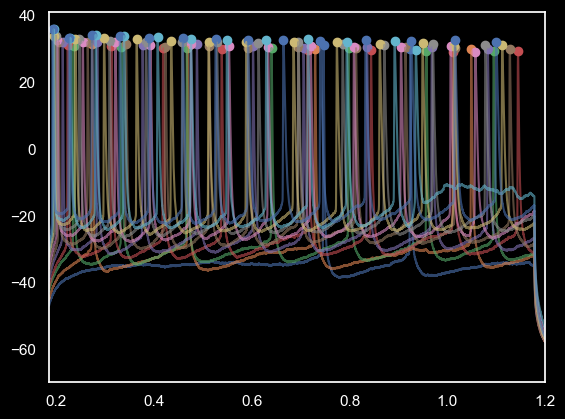

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

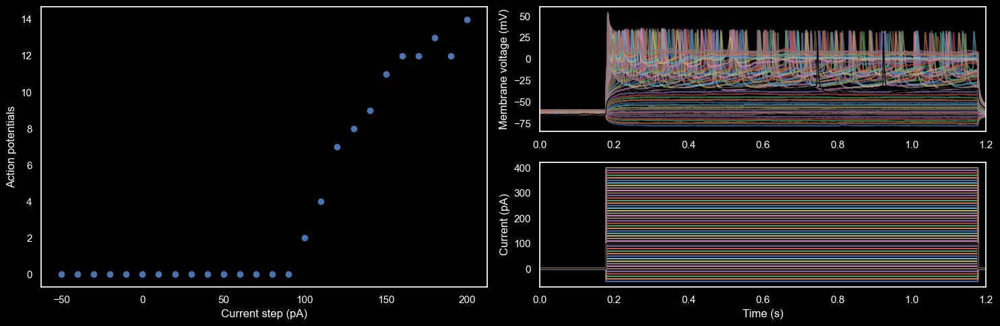

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0048_slice4_cell1_cortex_layer2_100um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


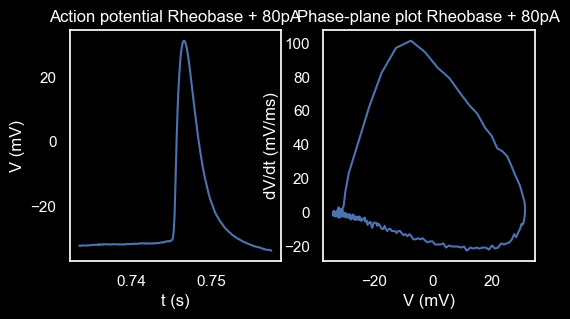

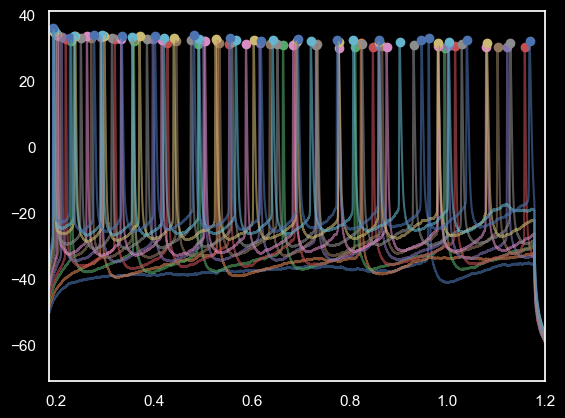

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

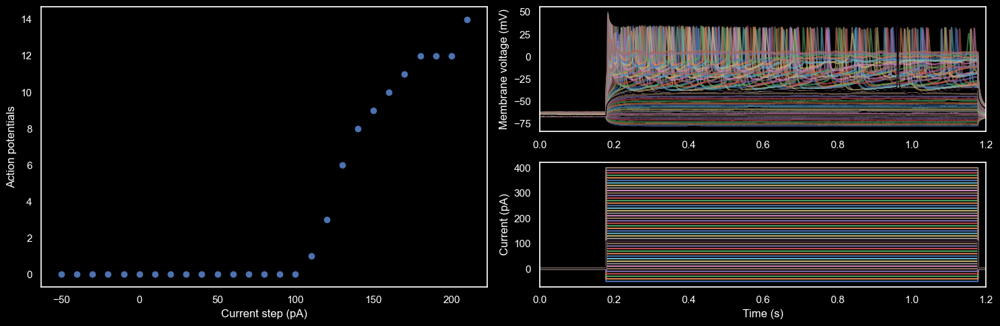

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0046_slice3_cell2_cortex_layer2_25um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


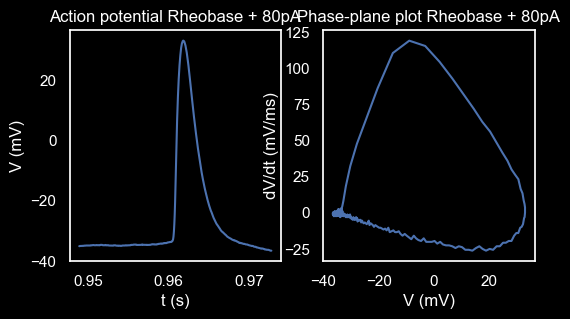

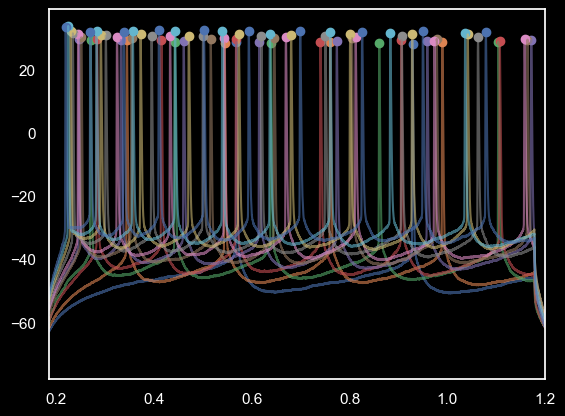

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

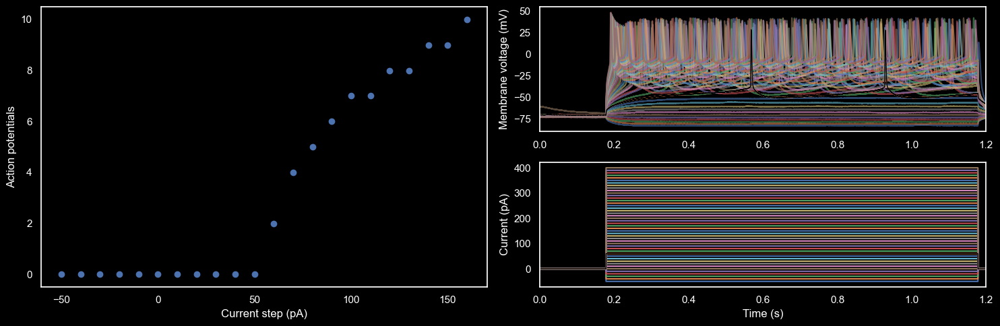

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_09_27_0071_slice5_cell1_cortex_layer2_400um-citrate_PN_WT


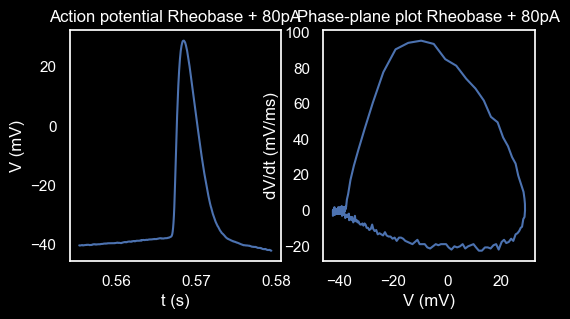

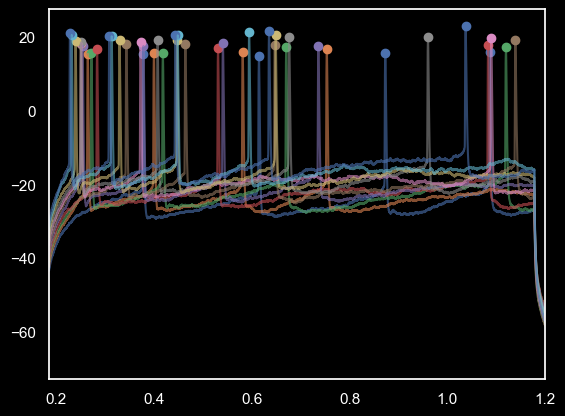

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

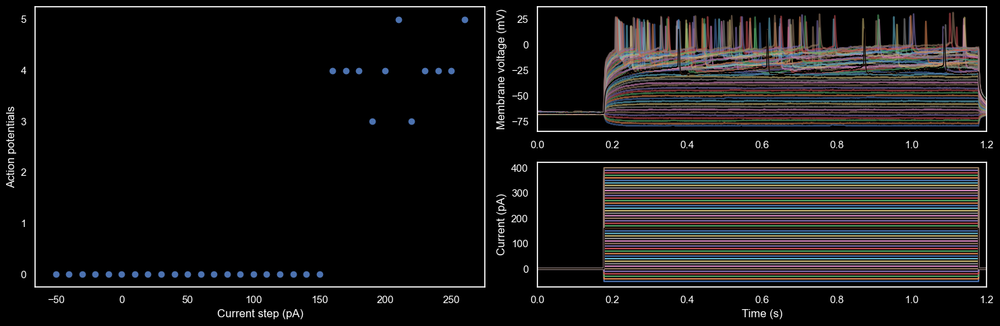

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_09_27_0051_slice4_cell1_cortex_layer2_200um-citrate_PN_WT


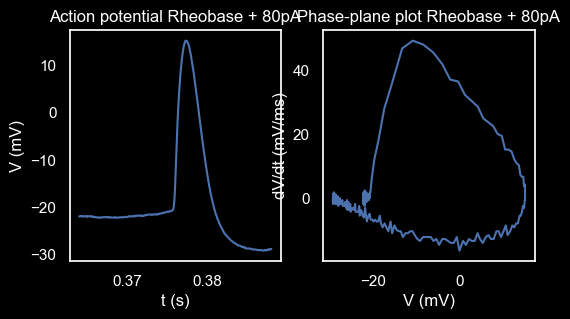

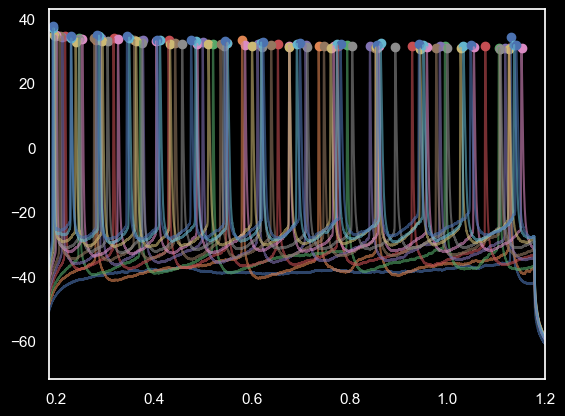

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

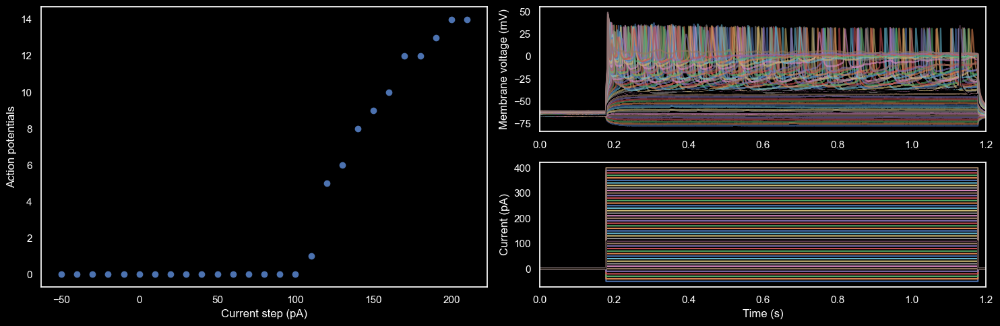

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_10_01_0035_slice2_cell1_cortex_layer2_100um-citrate_PN_KO


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


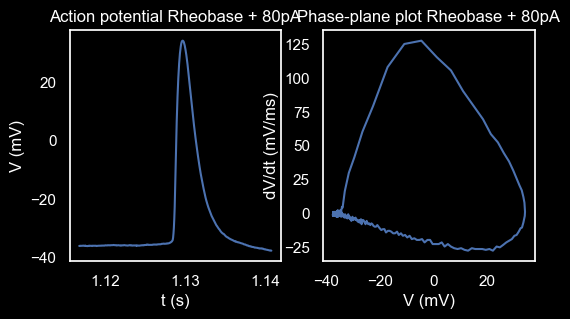

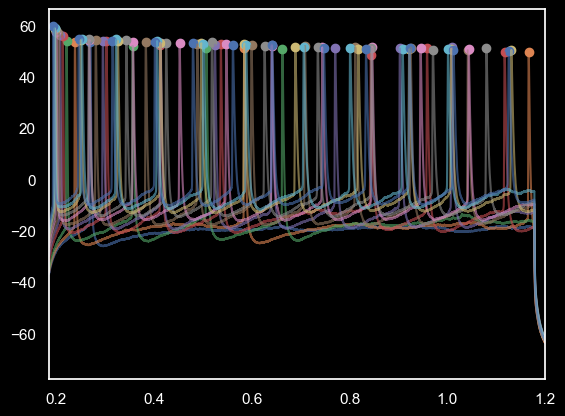

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

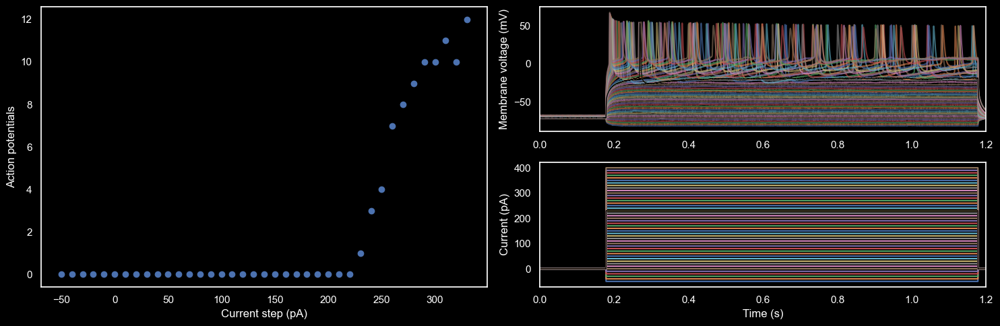

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_10_01_0032_slice2_cell1_cortex_layer2_50um-citrate_PN_KO


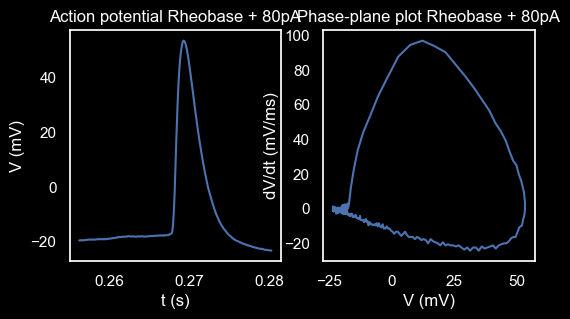

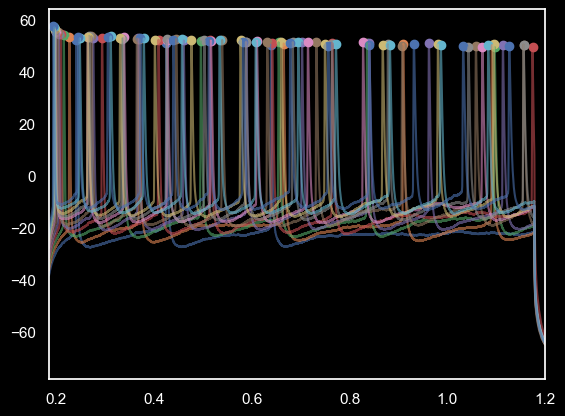

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

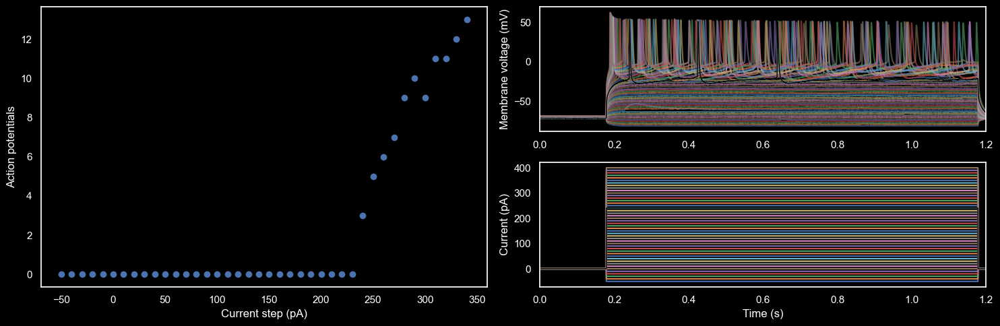

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_10_01_0028_slice2_cell1_cortex_layer2_no-treatment_PN_KO


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


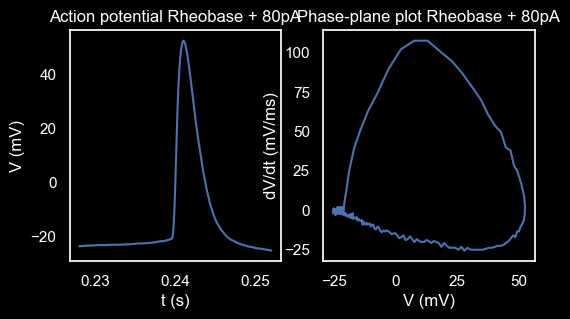

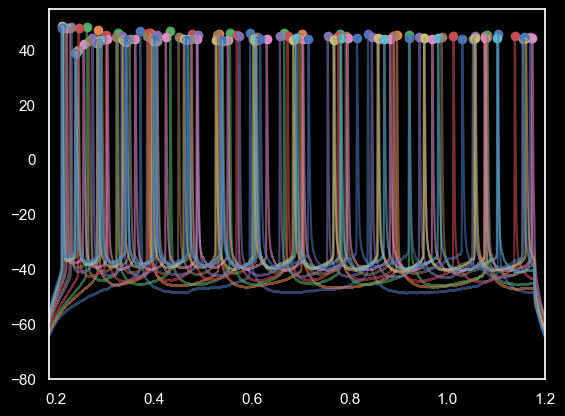

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

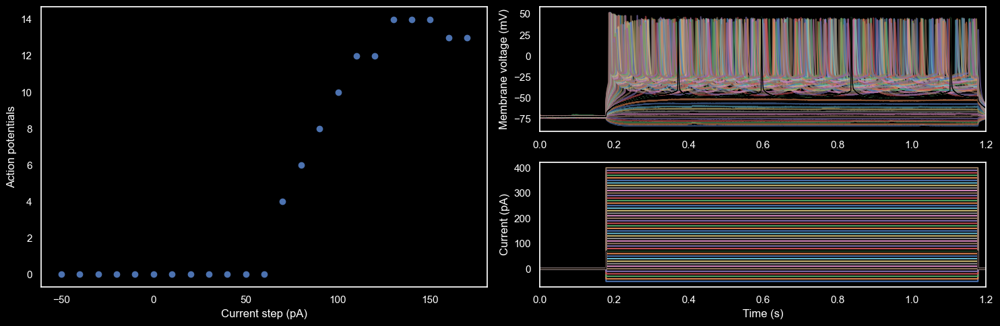

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0028_slice1_cell1_cortex_layer2_100um-citrate_PN_WT


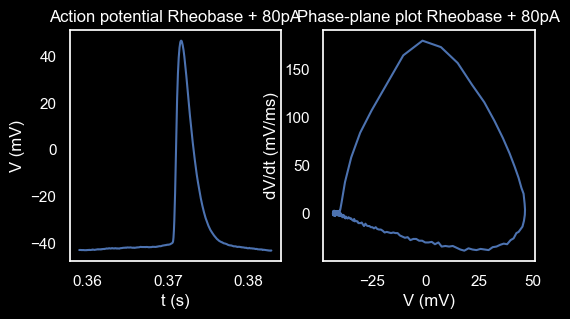

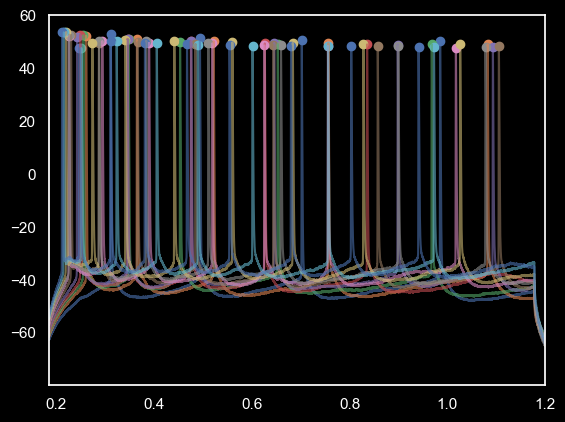

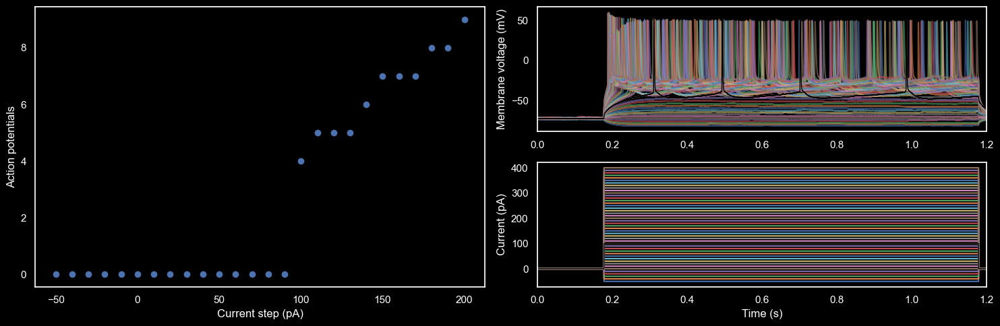

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0043_slice3_cell2_cortex_layer2_no-treatment_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


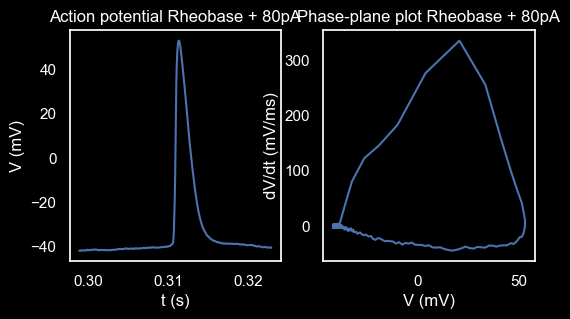

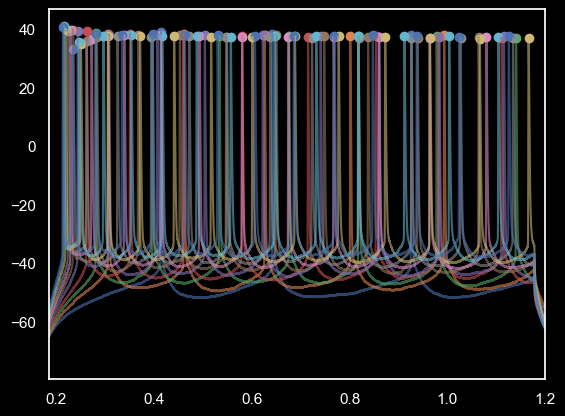

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


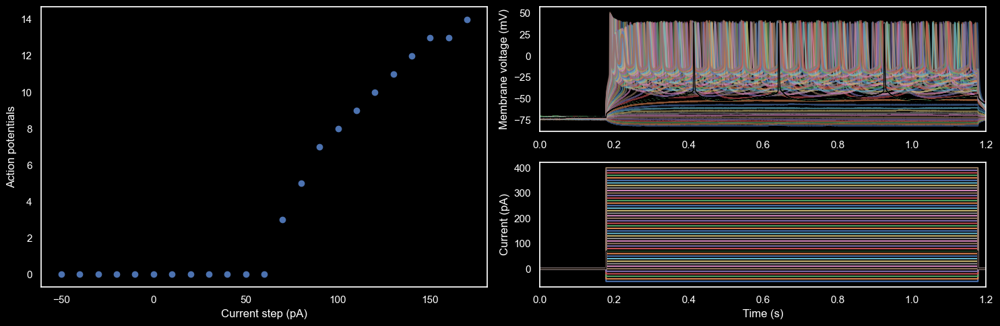

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0034_slice1_cell1_cortex_layer2_400um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


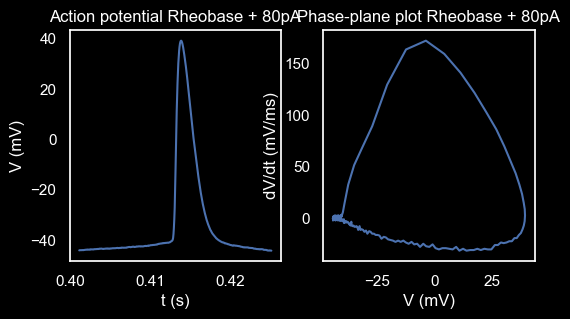

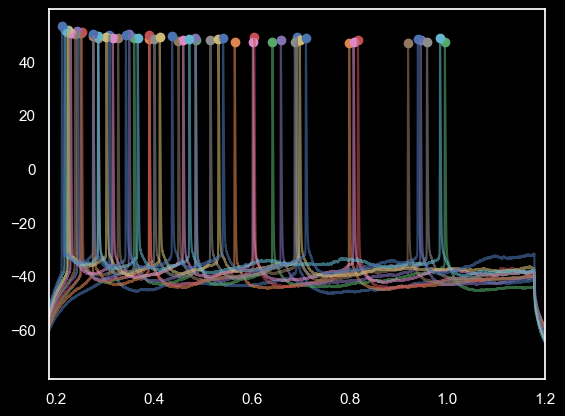

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


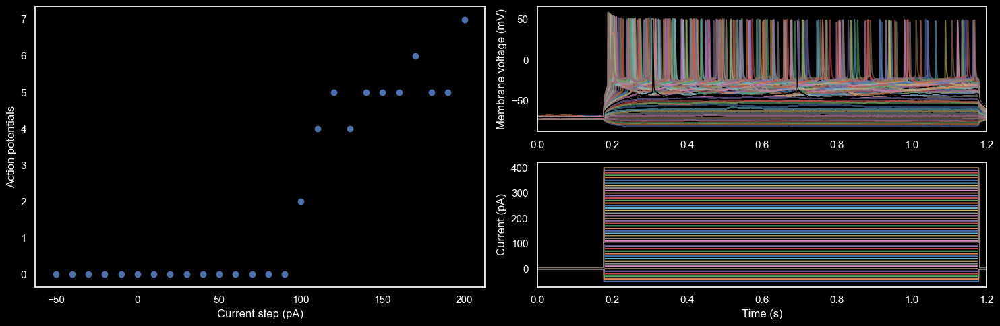

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0056_slice5_cell1_cortex_layer2_no-treatment_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


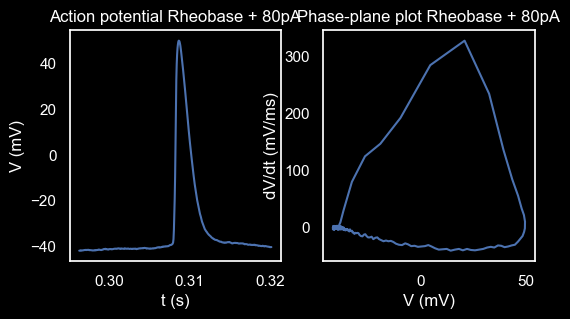

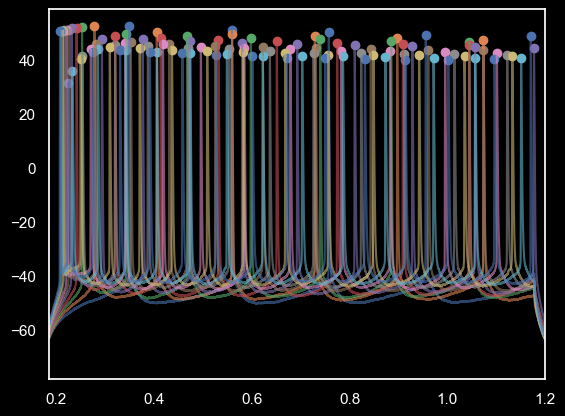

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


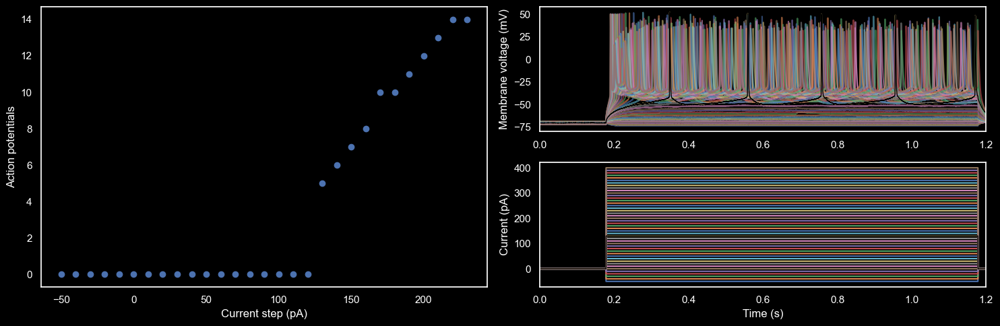

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0028_slice3_cell2_cortex_layer2_no-treatment_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


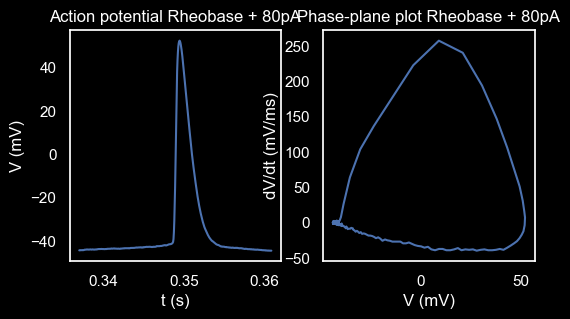

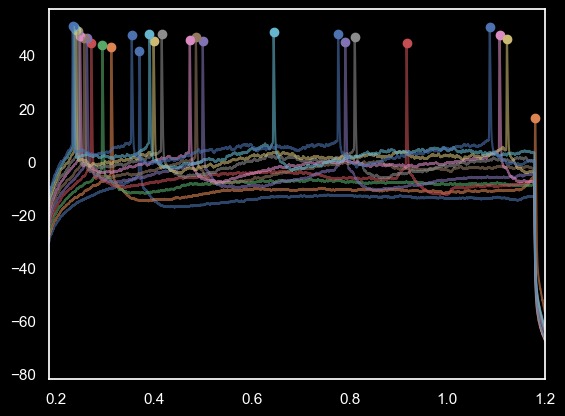

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

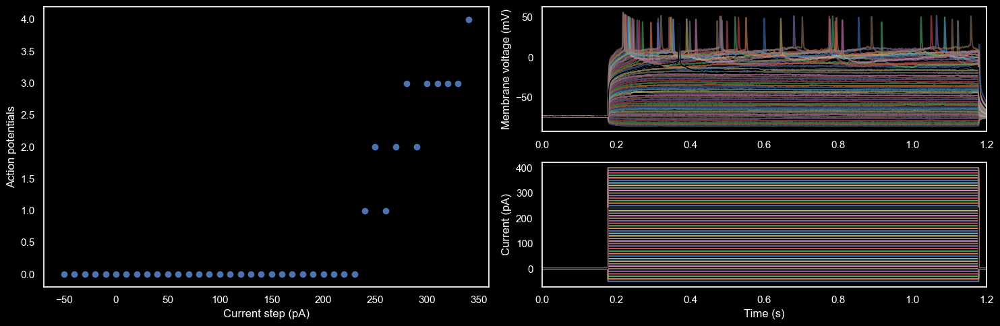

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0010_slice2_cell1_cortex_layer2_no-treatment_PN_WT


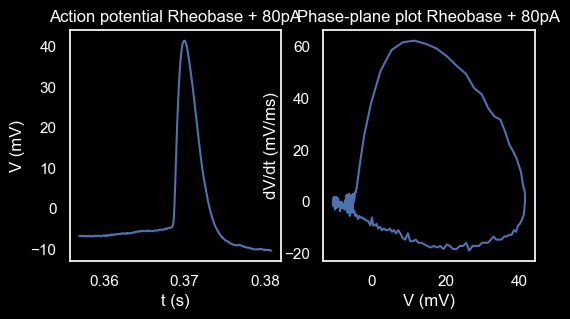

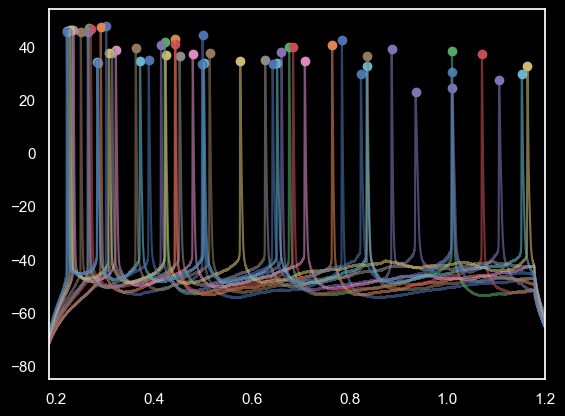

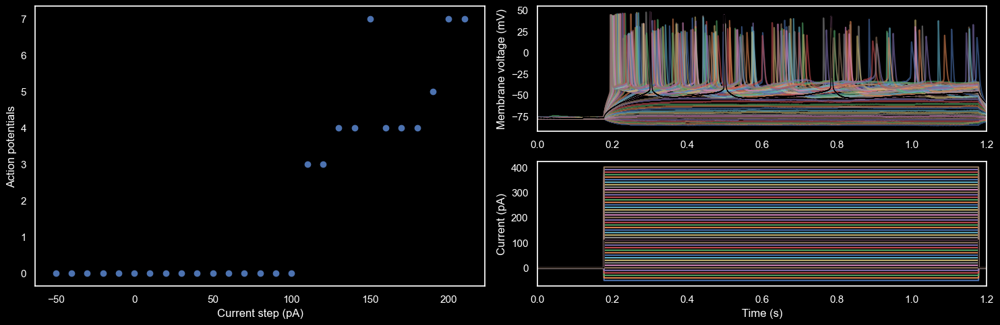

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


2023_09_27_0068_slice5_cell1_cortex_layer2_200um-citrate_PN_WT


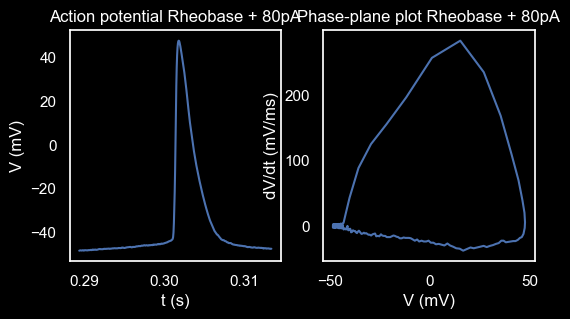

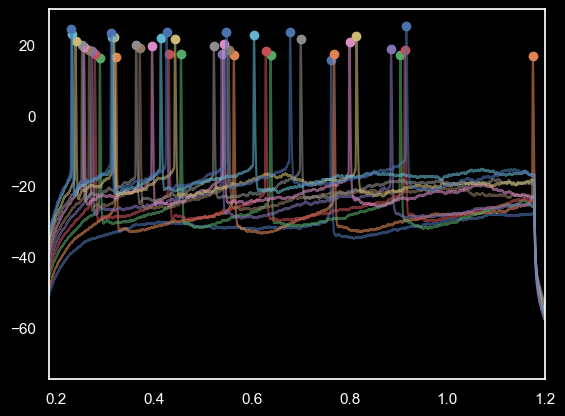

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

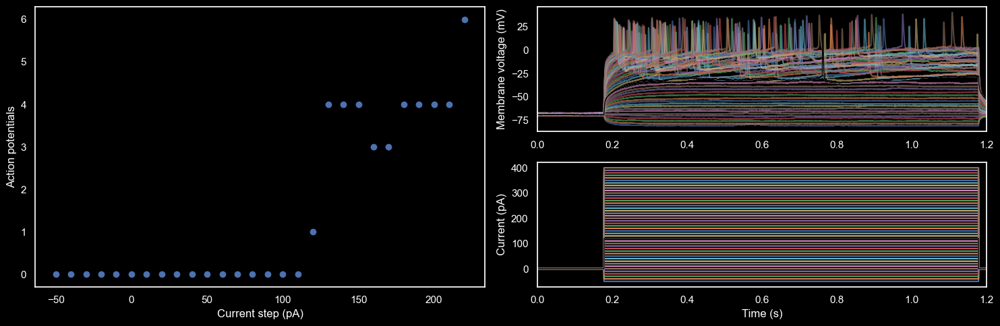

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_27_0005_slice1_cell1_cortex_layer2_no-treatment_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


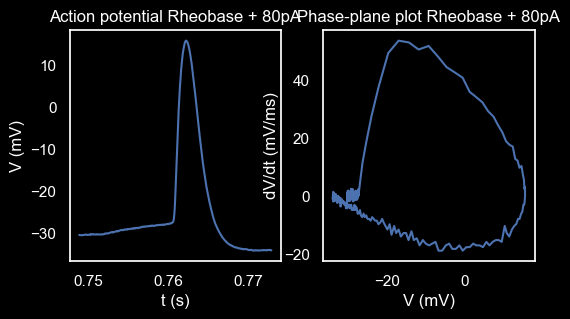

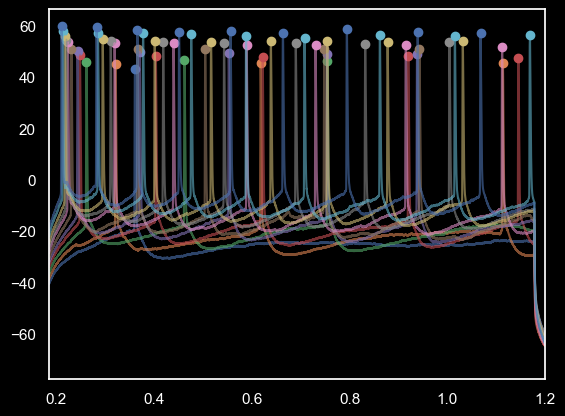

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

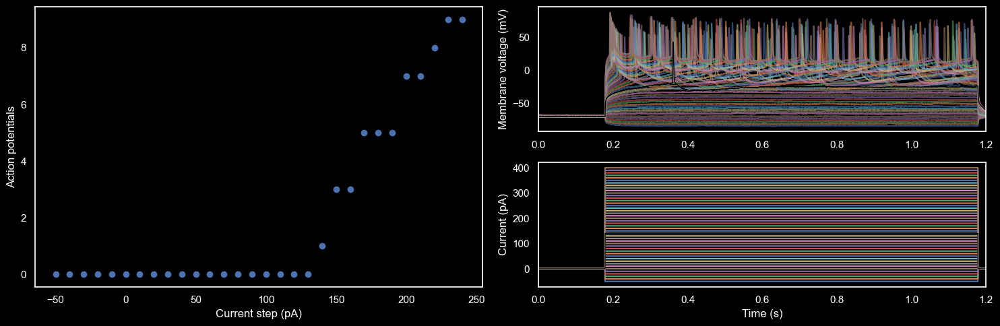

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



2023_09_20_0055_slice3_cell2_cortex_layer2_200um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


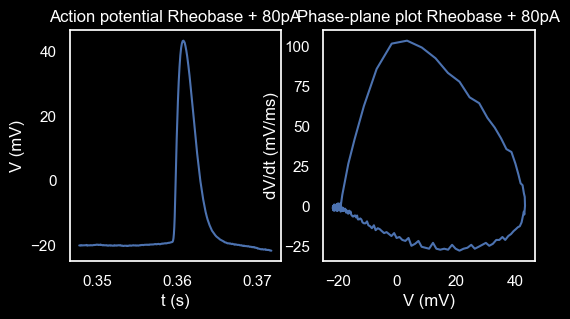

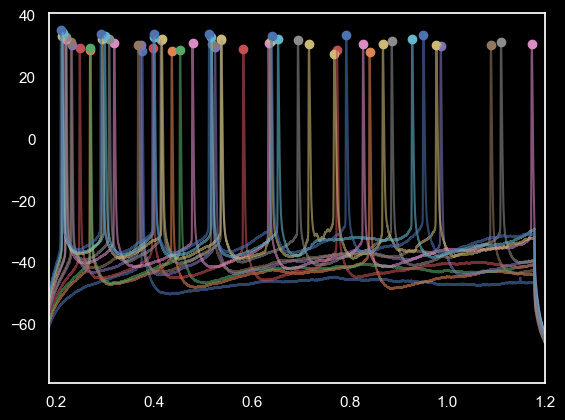

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

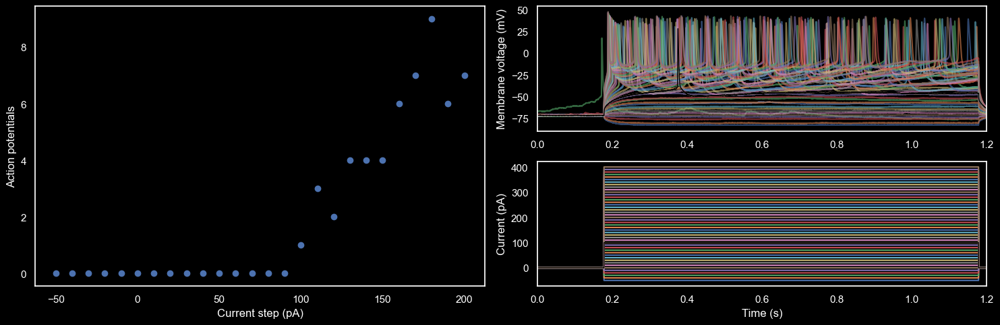

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  app.launch_new_instance()
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



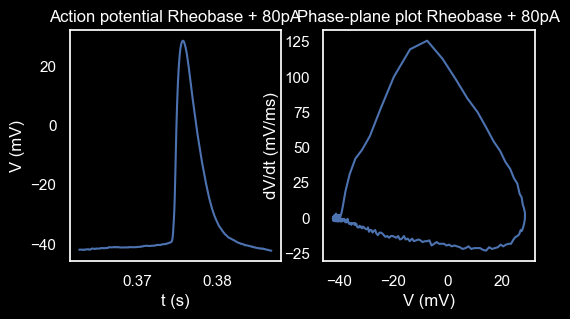

In [616]:
folder_path = '/Users/alicelin/Desktop/abf_files'
file_list = glob.glob(os.path.join(folder_path, "*.abf"))
compiled_indiv = pd.DataFrame()
compiled_agg = pd.DataFrame()
rheobase_spike_stats = pd.DataFrame()
rheobase_list = pd.DataFrame()
for file in file_list:
    current_file = spike_analysis(file)
    compiled_indiv = pd.concat([compiled_indiv, current_file])
    agg_current, rheobase = input_output(file)
    rheobase_sweep = current_file[current_file['sweep'] == rheobase+4]
    info = rheobase_sweep.iloc[0][['date', 'protocol_num', 'slice', 'cell', 'region', 'layer', 'treatment', 'cell_type', 'animal_genotype']]
    mean_data = rheobase_sweep[['threshold_v', 'width', 'amplitude', 'rise_time', 'fall_time', 'upstroke_downstroke_ratio']].mean()
    combined = pd.concat([info, mean_data])
    rheo = pd.Series([current_file[current_file['sweep'] == rheobase].iloc[0]['peak_i']], name = 'rheobase')
    r = pd.concat([info.T, rheo])
    rheobase_list = pd.concat([rheobase_list, r], axis = 1)
    rheobase_spike_stats = pd.concat([rheobase_spike_stats, combined], axis = 1)
    compiled_agg = pd.concat([compiled_agg, agg_current])
    phase_plots(file, rheobase)

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.


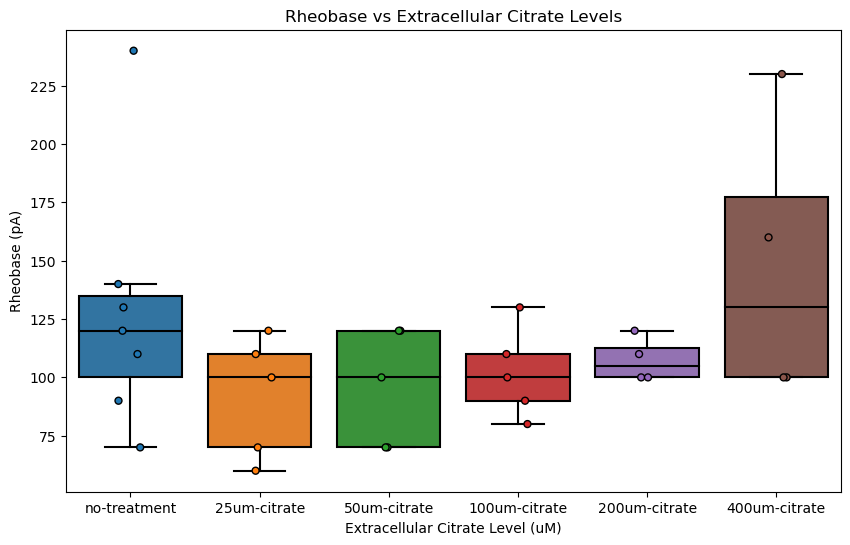

In [635]:
rheo = rheobase_list.T
wt_rheo = rheo[rheo['animal_genotype'] == 'WT'].reset_index()
fig = plt.figure(figsize=(10, 6))
boxprops = {'edgecolor': 'black'}

# Set the whiskerprops parameter to specify the whisker properties
whiskerprops = {'color': 'black'}

# Set the capprops parameter to specify the cap properties
capprops = {'color': 'black'}
# Set the medianprops parameter to specify the median properties
medianprops = {'color': 'black'}

sns.set(style="ticks")
plt.style.use('default') 

sns.boxplot(data = wt_rheo, x = 'treatment', y = 0, showfliers=False, order=category_order, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, medianprops=medianprops)
sns.stripplot(data = wt_rheo, x = 'treatment', y = 0, size = 5, linewidth = 1, palette=sns.color_palette(), edgecolor = 'black', dodge = False, order=category_order)
plt.tick_params(axis = 'x', rotation = 0)
plt.xlabel('Extracellular Citrate Level (uM)')
plt.ylabel('Rheobase (pA)')
plt.title('Rheobase vs Extracellular Citrate Levels')
fig.savefig("/Users/alicelin/Desktop/abf_files/RHEOBASE_white.svg", dpi=500)
# plt.show()
# wt_rheo


In [ ]:
rheo = rheobase_list.T
wt_rheo = rheo[rheo['animal_genotype'] == 'WT'].reset_index()
fig = plt.figure(figsize=(10, 6))
boxprops = {'edgecolor': 'white'}

# Set the whiskerprops parameter to specify the whisker properties
whiskerprops = {'color': 'white'}

# Set the capprops parameter to specify the cap properties
capprops = {'color': 'white'}
# Set the medianprops parameter to specify the median properties
medianprops = {'color': 'white'}

sns.boxplot(data = wt_rheo, x = 'treatment', y = 0, showfliers=False, order=category_order, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, medianprops=medianprops)
sns.stripplot(data = wt_rheo, x = 'treatment', y = 0, size = 5, linewidth = 1, palette=sns.color_palette(), edgecolor = 'white', dodge = False, order=category_order)
plt.tick_params(axis = 'x', rotation = 0)
plt.xlabel('Extracellular Citrate Level (uM)')
plt.ylabel('Rheobase (pA)')
plt.title('Rheobase vs Extracellular Citrate Levels')
fig.savefig("/Users/alicelin/Desktop/abf_files/RHEOBASE.svg", dpi=500)

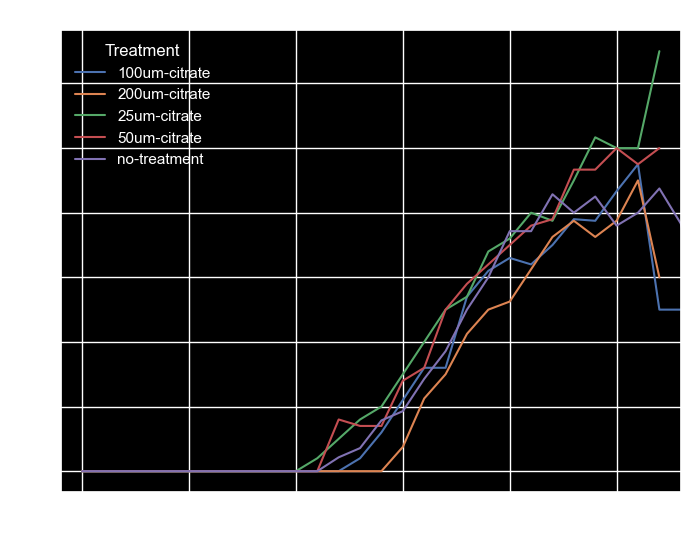

In [627]:
selected_treatments = ['no-treatment', '25um-citrate', '50um-citrate', '100um-citrate', '200um-citrate']


fig, ax = plt.subplots(figsize=(8, 6)) 
wt = compiled_agg[compiled_agg['animal_genotype'] == 'WT']
PN = wt[wt['cell_type'] == 'PN']
PN_selected = PN[PN['treatment'].isin(selected_treatments)]
PN.to_csv('/Users/alicelin/Desktop/abf_files/PN.csv')
stats = PN_selected.groupby(['treatment', 'current_step'])['avg_rate'].agg(['mean', 'std']).reset_index()
stats.to_csv('/Users/alicelin/Desktop/abf_files/PN_stats.csv')
# Plot the data
# Plot the data
plt.style.use('dark_background')
sns.set_theme(style="dark")
sns.set(style="ticks")
sns.set_theme(style="dark")
sns.set_theme(style="darkgrid")
sns.lineplot(
    data=stats,
    x="current_step",
    y="mean",
    hue="treatment",
    markers=True,
    dashes=False,
    ax = ax
)
# ax.errorbar(
#     x=stats["current_step"],
#     y=stats["mean"],
#     yerr=stats["std"],
#     fmt="none",
#     capsize=3,
#     color="white",  # Change the error bar color to white
#     zorder=5,
# )


# Set labels and title
ax.set_xlabel("Current Step", color = 'white')  # Set x-label color to white
ax.set_ylabel("Number of Action Potentials", color = 'white')  # Set y-label color to white
ax.set_title("PN Input-Output Curve", color = 'white')  # Set title color to white
ax.set_xlim([-60, 230])
# Set the tick color to white
ax.tick_params(colors='white')
ax.set_facecolor('black')
# Get the legend title and set its color to white
legend = ax.legend(title="Treatment")
# Set the legend background to transparent
legend.get_frame().set_alpha(0)

# Set the legend text color to white
for text in legend.get_texts():
    text.set_color('white')
title = legend.get_title()
title.set_color('white')

# Save the figure
fig.savefig("/Users/alicelin/Desktop/abf_files/INPUT_OUTPUT_PN.svg", dpi=300)
plt.show()

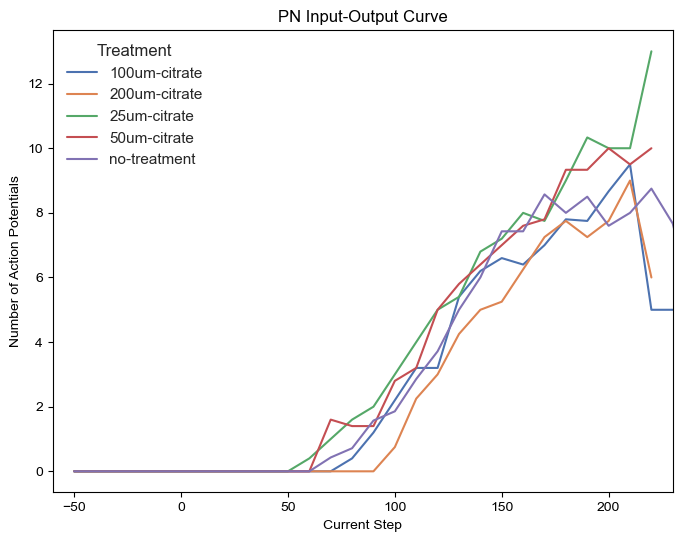

In [634]:
selected_treatments = ['no-treatment', '25um-citrate', '50um-citrate', '100um-citrate', '200um-citrate']


fig, ax = plt.subplots(figsize=(8, 6)) 
wt = compiled_agg[compiled_agg['animal_genotype'] == 'WT']
PN = wt[wt['cell_type'] == 'PN']
PN_selected = PN[PN['treatment'].isin(selected_treatments)]
PN.to_csv('/Users/alicelin/Desktop/abf_files/PN.csv')
stats = PN_selected.groupby(['treatment', 'current_step'])['avg_rate'].agg(['mean', 'std']).reset_index()
stats.to_csv('/Users/alicelin/Desktop/abf_files/PN_stats.csv')
# Plot the data
# Plot the data
plt.style.use('default')
#sns.set_theme(style="dark")
sns.set(style="ticks")
#sns.set_theme(style="dark")
#sns.set_theme(style="darkgrid")
sns.lineplot(
    data=stats,
    x="current_step",
    y="mean",
    hue="treatment",
    markers=True,
    dashes=False,
    ax = ax
)
# ax.errorbar(
#     x=stats["current_step"],
#     y=stats["mean"],
#     yerr=stats["std"],
#     fmt="none",
#     capsize=3,
#     color="white",  # Change the error bar color to white
#     zorder=5,
# )


# Set labels and title
ax.set_xlabel("Current Step")  # Set x-label color to white
ax.set_ylabel("Number of Action Potentials")  # Set y-label color to white
ax.set_title("PN Input-Output Curve")  # Set title color to white
ax.set_xlim([-60, 230])
# Set the tick color to white
#ax.tick_params(colors='white')
#ax.set_facecolor('black')
# Get the legend title and set its color to white
legend = ax.legend(title="Treatment")
# Set the legend background to transparent
legend.get_frame().set_alpha(0)

# Set the legend text color to white
#for text in legend.get_texts():
#    text.set_color('white')
#title = legend.get_title()
#title.set_color('white')

# Save the figure
fig.savefig("/Users/alicelin/Desktop/abf_files/INPUT_OUTPUT_PN_whitw.svg", dpi=300)
plt.show()

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.


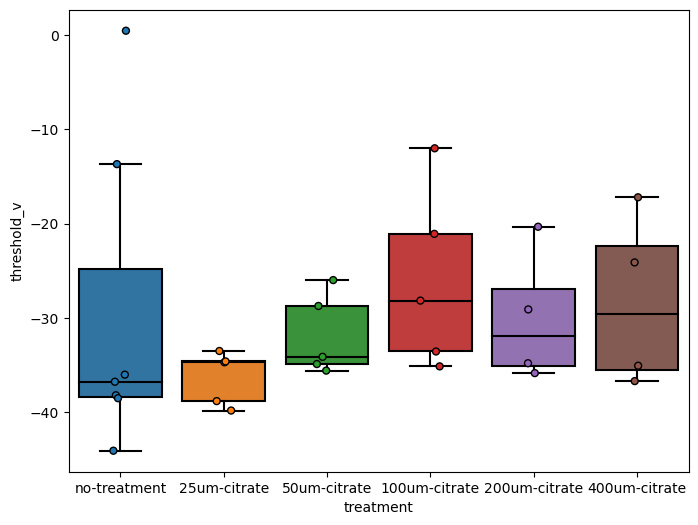

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.


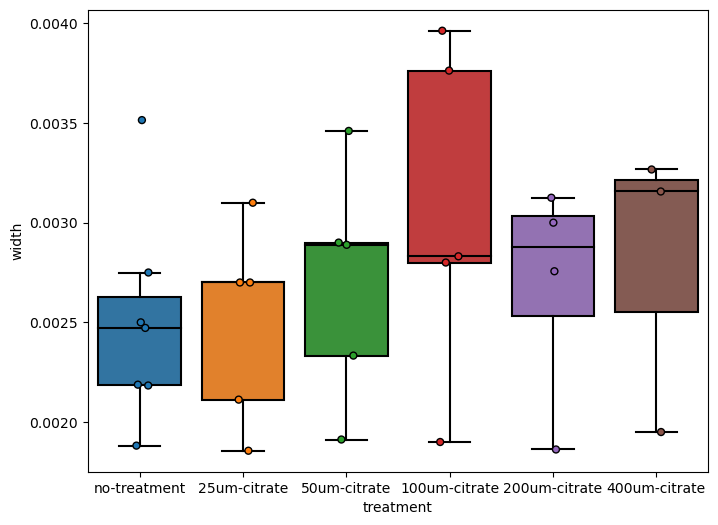

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.


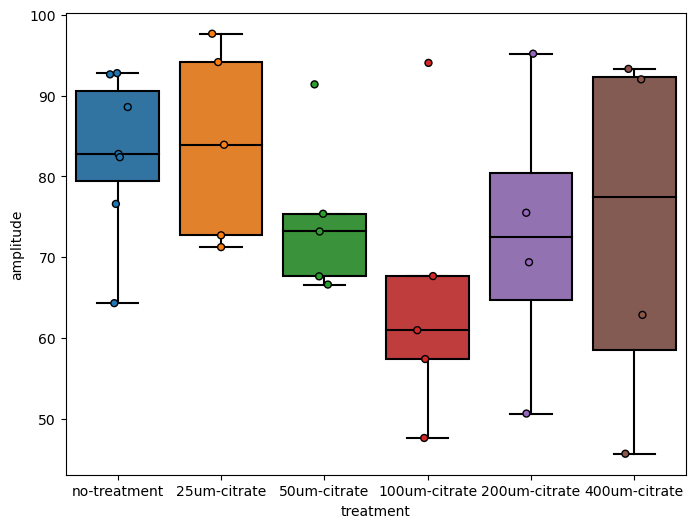

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.


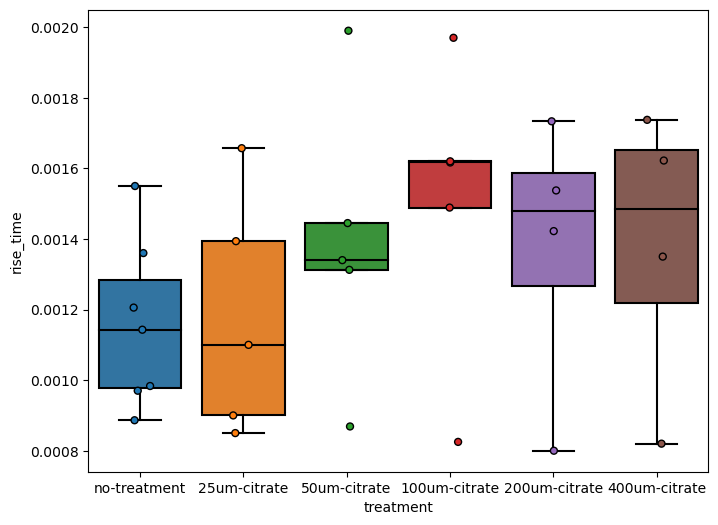

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.


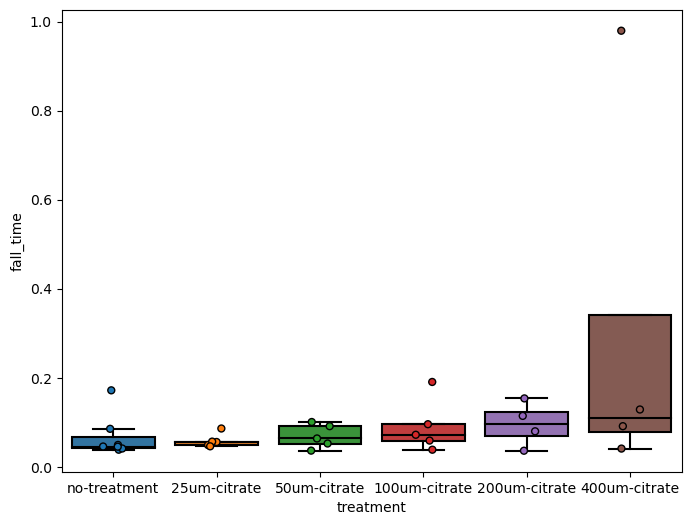

/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: The palette list has more values (10) than needed (6), which may not be intended.


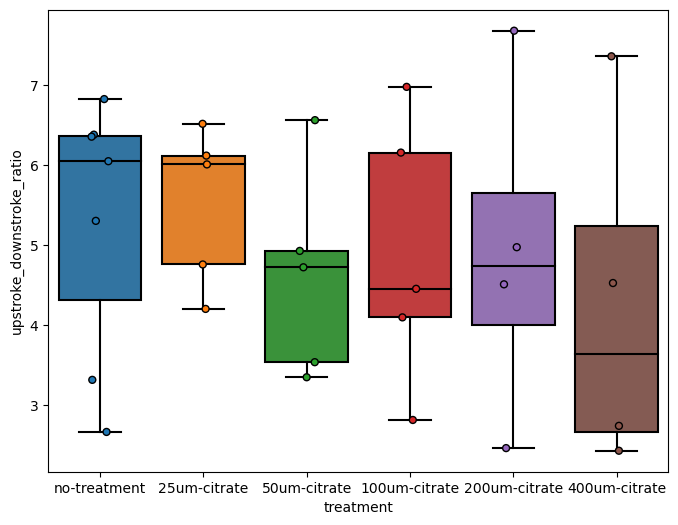

In [637]:
wt = rheobase_spike_stats.T[rheobase_spike_stats.T['animal_genotype'] == 'WT']
PN = wt[wt['cell_type'] == 'PN']
PN = PN.reset_index()


PN.to_csv('/Users/alicelin/Desktop/abf_files/MSN.csv')
#stats2 = PN.groupby(['treatment'])['threshold_v', 'width', 'amplitude', 'rise_time', 'fall_time', 'upstroke_downstroke_ratio'].agg(['mean', 'std', 'count']).reset_index()
columns = ['threshold_v', 'width', 'amplitude', 'rise_time', 'fall_time', 'upstroke_downstroke_ratio']

category_order = ['no-treatment', '25um-citrate', '50um-citrate', '100um-citrate', '200um-citrate', '400um-citrate']
for i in columns:
    fig = plt.figure(figsize=(8, 6))
    boxprops = {'edgecolor': 'black'}

    # Set the whiskerprops parameter to specify the whisker properties
    whiskerprops = {'color': 'black'}

    # Set the capprops parameter to specify the cap properties
    capprops = {'color': 'black'}
    # Set the medianprops parameter to specify the median properties
    medianprops = {'color': 'black'}

    sns.set(style="ticks")
    plt.style.use('default') 
    #sns.set_theme(style="dark")
    #sns.set_theme(style="darkgrid")
    sns.boxplot(data = PN, x = 'treatment', y = i, showfliers=False, order=category_order, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, medianprops=medianprops)
    sns.stripplot(data = PN, x = 'treatment', y = i, size = 5, linewidth = 1, palette=sns.color_palette(), edgecolor = 'black', dodge = False, order=category_order)
    plt.tick_params(axis = 'x', rotation = 0)
    save_str = "/Users/alicelin/Desktop/abf_files/" + f'{i}' + "_white.svg"
    fig.savefig(save_str, dpi=300)
    plt.show()
    

In [ ]:
wt = rheobase_spike_stats.T[rheobase_spike_stats.T['animal_genotype'] == 'WT']
PN = wt[wt['cell_type'] == 'PN']
PN = PN.reset_index()


PN.to_csv('/Users/alicelin/Desktop/abf_files/MSN.csv')
#stats2 = PN.groupby(['treatment'])['threshold_v', 'width', 'amplitude', 'rise_time', 'fall_time', 'upstroke_downstroke_ratio'].agg(['mean', 'std', 'count']).reset_index()
columns = ['threshold_v', 'width', 'amplitude', 'rise_time', 'fall_time', 'upstroke_downstroke_ratio']

category_order = ['no-treatment', '25um-citrate', '50um-citrate', '100um-citrate', '200um-citrate', '400um-citrate']
for i in columns:
    fig = plt.figure()
    boxprops = {'edgecolor': 'white'}

    # Set the whiskerprops parameter to specify the whisker properties
    whiskerprops = {'color': 'black'}

    # Set the capprops parameter to specify the cap properties
    capprops = {'color': 'black'}
    # Set the medianprops parameter to specify the median properties
    medianprops = {'color': 'black'}

    sns.set(style="ticks")
    plt.style.use('default') 
    #sns.set_theme(style="dark")
    #sns.set_theme(style="darkgrid")
    sns.boxplot(data = PN, x = 'treatment', y = i, showfliers=False, order=category_order, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops, medianprops=medianprops)
    sns.stripplot(data = PN, x = 'treatment', y = i, size = 5, linewidth = 1, palette=sns.color_palette(), edgecolor = 'black', dodge = False, order=category_order)
    plt.tick_params(axis = 'x', rotation = 45)
    save_str = "/Users/alicelin/Desktop/abf_files/" + f'{i}' + "_white.svg"
    fig.savefig(save_str, dpi=300)
    plt.show()

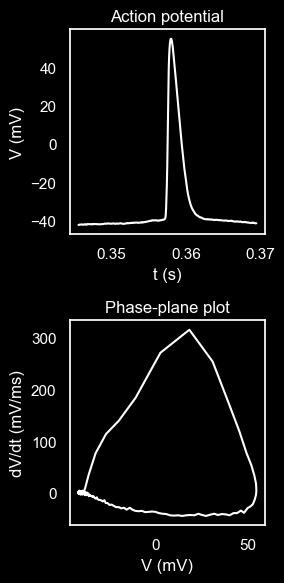

In [567]:
# Set the background color to black
plt.rcParams['axes.facecolor'] = 'black'
plt.rcParams['figure.facecolor'] = 'black'

# Set the text color to white
plt.rcParams['text.color'] = 'white'
plt.rcParams['axes.labelcolor'] = 'white'
plt.rcParams['xtick.color'] = 'white'
plt.rcParams['ytick.color'] = 'white'
plt.rcParams['legend.facecolor'] = 'black'
plt.rcParams['legend.edgecolor'] = 'white'
abf = pyabf.ABF('/Users/alicelin/Desktop/abf_files/2023_09_20_0018_slice1_cell1_cortex_layer2_no-treatment_PN_WT.abf')
dv_dt80 = dv_dt(abf, 14, 20000, 12)
# Table with the voltage and dV/dt values
table80 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
table80['voltage'] = pd.Series(dv_dt80['voltage'])
table80['dv_dt'] = pd.Series(dv_dt80['dv_dt'])
# Graphs
fig = plt.figure(figsize=(3, 6))
# Action potential
ax1 = fig.add_subplot(2,1,1)
ax1.set_title('Action potential')
ax1.plot(dv_dt80['time'], dv_dt80['voltage'], color = 'white')
ax1.set_ylabel("V (mV)") 
ax1.set_xlabel("t (s)")
plt.grid(False)
# Phase plot
ax2 =fig.add_subplot(2,1,2)
ax2.set_title('Phase-plane plot')
ax2.plot(dv_dt80['voltage_array'], dv_dt80['dv_dt'], color = 'white')
ax2.set_ylabel("dV/dt (mV/ms)") 
ax2.set_xlabel("V (mV)") 
plt.grid(False)
fig.tight_layout()

fig.savefig("/Users/alicelin/Desktop/abf_files/EPHYS_phase_sample_PN.svg", dpi=300)

<Figure size 640x480 with 0 Axes>

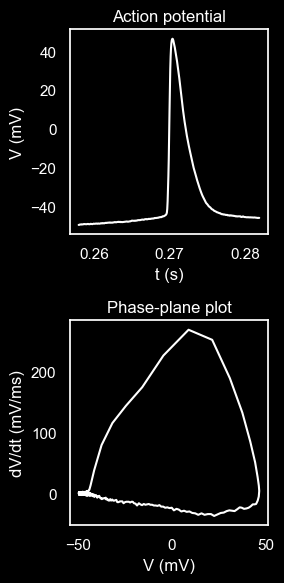

In [346]:

fig = plt.figure()
abf = pyabf.ABF('/Users/alicelin/Desktop/abf_files/2023_09_27_0010_slice2_cell1_cortex_layer2_no-treatment_MSN_WT.abf')
dv_dt80 = dv_dt(abf, 19, 20000, 12)
# Table with the voltage and dV/dt values
table80 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
table80['voltage'] = pd.Series(dv_dt80['voltage'])
table80['dv_dt'] = pd.Series(dv_dt80['dv_dt'])
# Graphs
fig = plt.figure(figsize=(3, 6))
# Action potential
ax1 = fig.add_subplot(2,1,1)
ax1.set_title('Action potential')
ax1.plot(dv_dt80['time'], dv_dt80['voltage'], color = 'white')
ax1.set_ylabel("V (mV)") 
ax1.set_xlabel("t (s)")
plt.grid(False)
# Phase plot
ax2 =fig.add_subplot(2,1,2)
ax2.set_title('Phase-plane plot')
ax2.plot(dv_dt80['voltage_array'], dv_dt80['dv_dt'], color = 'white')
ax2.set_ylabel("dV/dt (mV/ms)") 
ax2.set_xlabel("V (mV)") 
plt.grid(False)
fig.tight_layout()
fig.savefig("/Users/alicelin/Desktop/abf_files/EPHYS_phase_sample_MSN.svg", dpi=300)

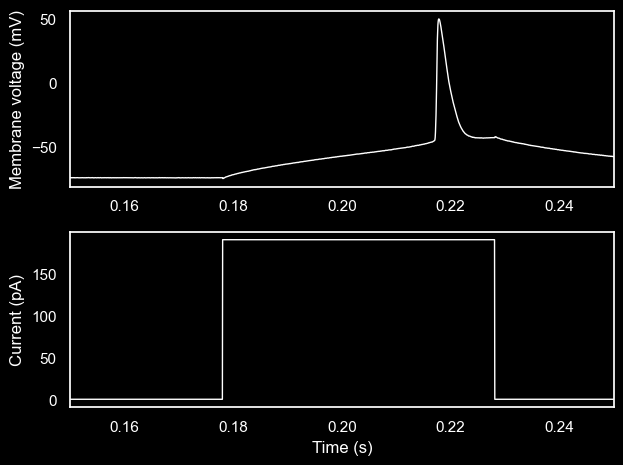

In [323]:
fig = plt.figure()
abf = pyabf.ABF('/Users/alicelin/Desktop/temp_abf/2023_09_27_0008.abf')
# All traces
ax2 = fig.add_subplot(2, 1, 1)

ax2.set_ylabel('Membrane voltage (mV)')
# ax2.legend() # Optional
# To highllight one trace
abf.setSweep(rheobase+9) 
ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='white')
plt. grid(False)
ax2.axes.set_xlim(0.15, 0.25)  # Range of the x-axis (seconds)

# All current steps
ax3 = fig.add_subplot(2, 1, 2, sharex=ax2) 
ax3.set_ylabel("Current (pA)")
ax3.set_xlabel("Time (s)")
# To highllight one current trace
abf.setSweep(rheobase+9) 
ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='white')
fig.tight_layout()
plt. grid(False)
# Show the graph and the table results 
plt.show()

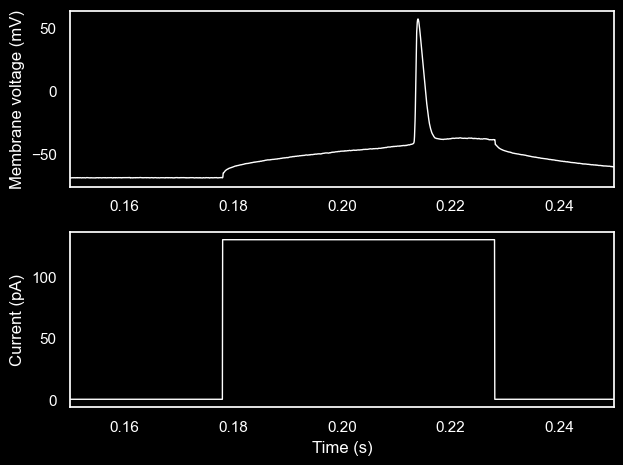

In [324]:
fig = plt.figure()
abf = pyabf.ABF('/Users/alicelin/Desktop/temp_abf/2023_09_20_0017.abf')
# All traces
ax2 = fig.add_subplot(2, 1, 1)

ax2.set_ylabel('Membrane voltage (mV)')
# ax2.legend() # Optional
# To highllight one trace
abf.setSweep(rheobase+3) 
ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='white')
plt. grid(False)
ax2.axes.set_xlim(0.15, 0.25) # Range of the x-axis (seconds)

# All current steps
ax3 = fig.add_subplot(2, 1, 2, sharex=ax2) 
ax3.set_ylabel("Current (pA)")
ax3.set_xlabel("Time (s)")
# To highllight one current trace
abf.setSweep(rheobase+3) 
ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='white')
fig.tight_layout()
plt. grid(False)
# Show the graph and the table results 
plt.show()

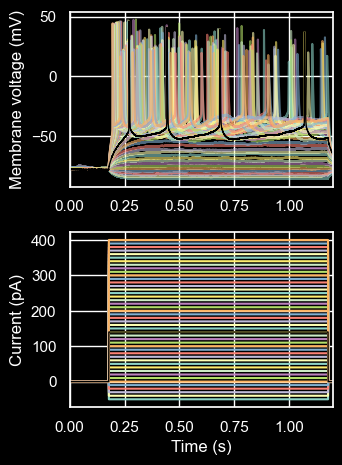

In [334]:
fig = plt.figure()
abf = pyabf.ABF('/Users/alicelin/Desktop/abf_files/2023_09_27_0010_slice2_cell1_cortex_layer2_no-treatment_MSN_WT.abf')

# All traces
ax2 = fig.add_subplot(2, 2, 2)
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    ax2.plot(abf.sweepX, abf.sweepY, alpha=.6, label="Sweep %d" % (sweep))
ax2.set_ylabel('Membrane voltage (mV)')
# ax2.legend() # Optional
# To highllight one trace
abf.setSweep(19) 
ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='black')
ax2.axes.set_xlim(0, 1.2) # Range of the x-axis (seconds)

# All current steps
ax3 = fig.add_subplot(2, 2, 4, sharex=ax2) 
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    current = abf.sweepC
    ax3.plot(abf.sweepX, current)
ax3.set_ylabel("Current (pA)")
ax3.set_xlabel("Time (s)")
# To highllight one current trace
abf.setSweep(19) 
ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='black')
fig.tight_layout()
# Show the graph and the table results 
plt.show()

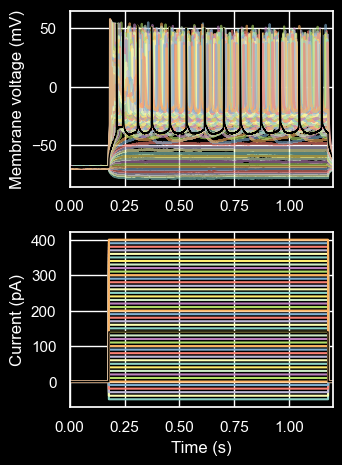

In [335]:
fig = plt.figure()
abf = pyabf.ABF('/Users/alicelin/Desktop/abf_files/2023_09_20_0018_slice1_cell1_cortex_layer2_no-treatment_PN_WT.abf')

# All traces
ax2 = fig.add_subplot(2, 2, 2)
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    ax2.plot(abf.sweepX, abf.sweepY, alpha=.6, label="Sweep %d" % (sweep))
ax2.set_ylabel('Membrane voltage (mV)')
# ax2.legend() # Optional
# To highllight one trace
abf.setSweep(19) 
ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='black')
ax2.axes.set_xlim(0, 1.2) # Range of the x-axis (seconds)

# All current steps
ax3 = fig.add_subplot(2, 2, 4, sharex=ax2) 
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    current = abf.sweepC
    ax3.plot(abf.sweepX, current)
ax3.set_ylabel("Current (pA)")
ax3.set_xlabel("Time (s)")
# To highllight one current trace
abf.setSweep(19) 
ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='black')
fig.tight_layout()
# Show the graph and the table results 
plt.show()

In [ ]:
wt = compiled_agg[compiled_agg['animal_genotype'] == 'WT']
PN = wt[wt['cell_type'] == 'PN']
no_treatment = PN[PN['treatment'] == 'no-treatment']
plt.scatter(no_treatment['current_step'], no_treatment['avg_rate'])
plt.show()

MSN = wt[wt['cell_type'] == 'MSN']
no_treatment_MSN = MSN[MSN['treatment'] == 'no-treatment']
plt.scatter(no_treatment_MSN['current_step'], no_treatment_MSN['avg_rate'])
plt.show()